# MVTec AD Dataset Exploration and Visualization

## *1. Dataset Loading and Preprocessing*

### **1.1. Importing Required Libraries**


This notebook helps you explore the MVTec AD dataset by:
- Understanding its structure
- Visualizing samples of normal and defective images
- Analyzing ground truth annotations
- Gathering insights into the dataset distribution

In [1]:
import os
import torch
import cv2
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from plotly.subplots import make_subplots
from joypy import joyplot
from torchvision.io import read_image
from torch.utils.data import DataLoader, Dataset


### **1.2. Dataset Overview**

Let's load the dataset and check the structure and categories.

In [2]:

# Define the relative path to the dataset
dataset_dir = os.path.join(os.path.dirname(os.path.abspath("__file__")), "mvtec_anomaly_detection")
dataset_dir = os.path.normpath(dataset_dir)


# List all categories in the dataset in alphabetical order
categories = sorted([category for category in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, category))])



# Function to count train and test images for each category
def count_images(category):
    
    train_count = len(os.listdir(os.path.normpath(os.path.join(dataset_dir, category, 'train/good'))))
    test_count = 0
    test_path = os.path.join(dataset_dir, category, 'test')
    for subfolder in os.listdir(test_path):
        subfolder_path = os.path.join(test_path, subfolder)
        if os.path.isdir(subfolder_path):
            test_count += len(os.listdir(subfolder_path))
    
    return train_count, test_count

# Display image counts for all categories in a table
image_counts = {category: count_images(category) for category in categories}

# Extract train counts and test counts for all categories
train_counts = [count_images(category)[0] for category in categories]
test_counts = [count_images(category)[1] for category in categories]

# Create a dataframe to display the counts
df_counts = pd.DataFrame.from_dict(image_counts, orient='index', columns=['Train', 'Test'])
df_counts.index.name = 'Category'
df_counts.reset_index(inplace=True)


# Now you can use train_counts and test_counts
y_train = train_counts
y_test = test_counts


# Add a row for the total counts
total_train = df_counts['Train'].sum()
total_test = df_counts['Test'].sum()
total_row = pd.DataFrame([['Total', total_train, total_test]], columns=df_counts.columns)
df_counts = pd.concat([df_counts, total_row], ignore_index=True)
# Add a column for the total counts
df_counts['Total'] = df_counts['Train'] + df_counts['Test']

df_counts


,Category,Train,Test,Total
0,bottle,209,83,292
1,cable,224,150,374
2,capsule,219,132,351
3,carpet,280,117,397
4,grid,264,78,342
5,hazelnut,391,110,501
6,leather,245,124,369
7,metal_nut,220,115,335
8,pill,267,167,434
9,screw,320,160,480


### **1.3. Visualizing Dataset Distribution**

In [3]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=categories,
    y=train_counts,
    name='Train',
    marker_color='blue'
))

fig.add_trace(go.Bar(
    x=categories,
    y=test_counts,
    name='Test',
    marker_color='red'
))

fig.update_layout(
    title='Distribution of Train and Test Images across Categories',
    xaxis_title='Categories',
    yaxis_title='Number of Images',
    barmode='group'
)

fig.update_layout(
    width=800,  
    height=400 
)
fig.show()

### **1.4. Visualizing Sample Images**

Let's visualize a few images from the training and testing sets.

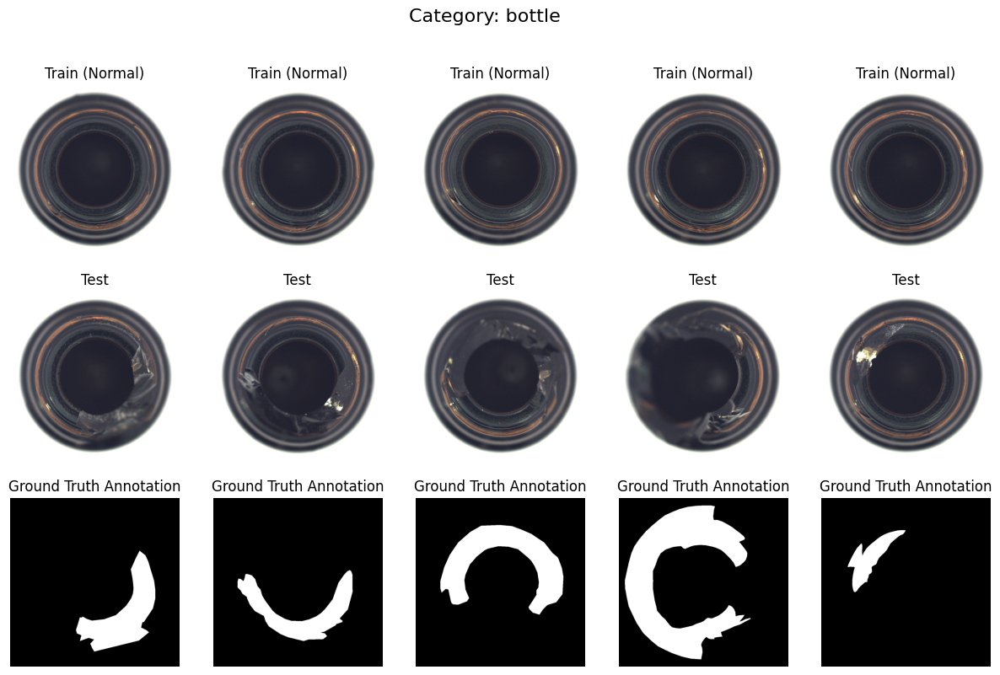

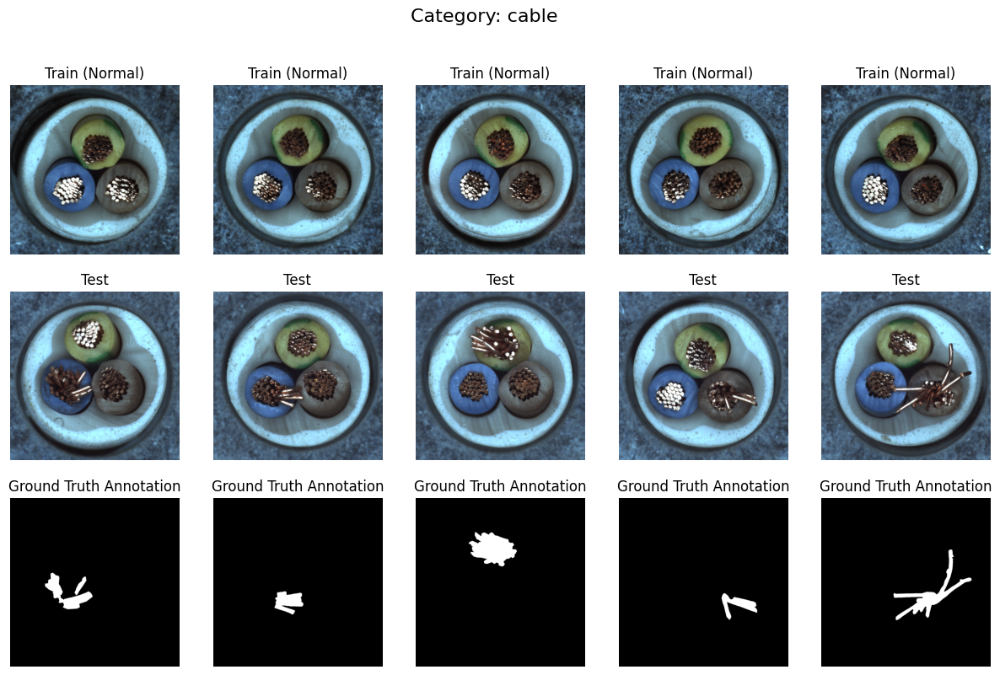

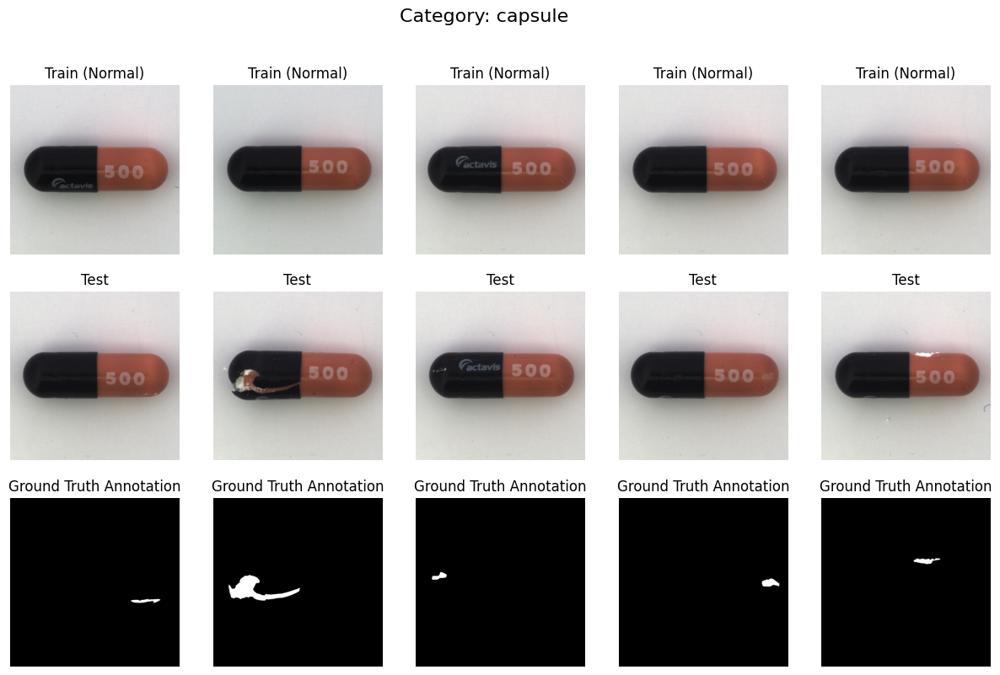

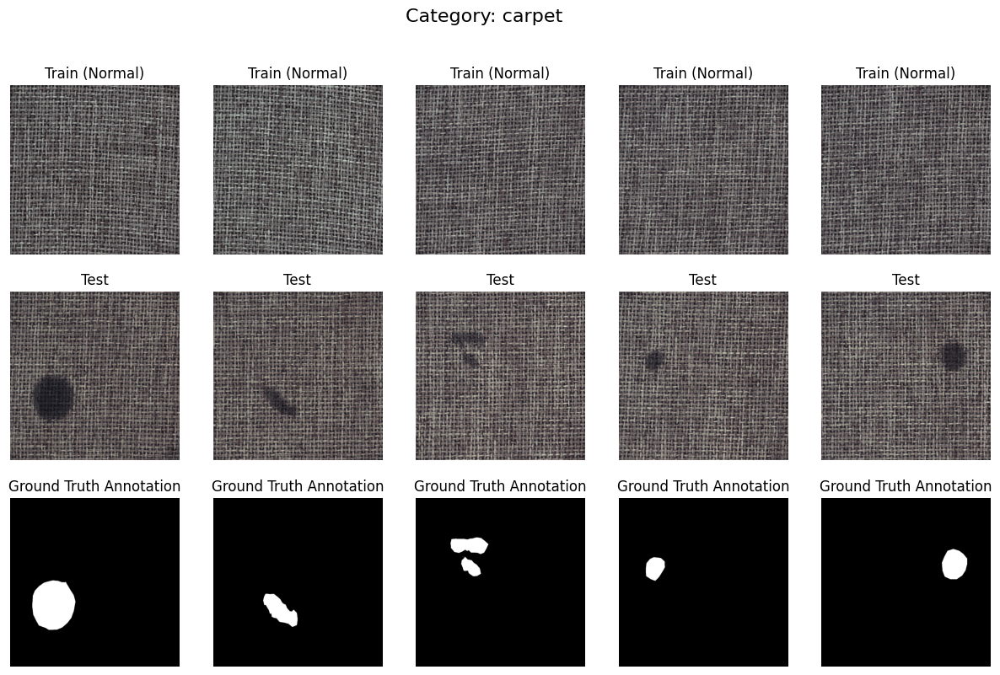

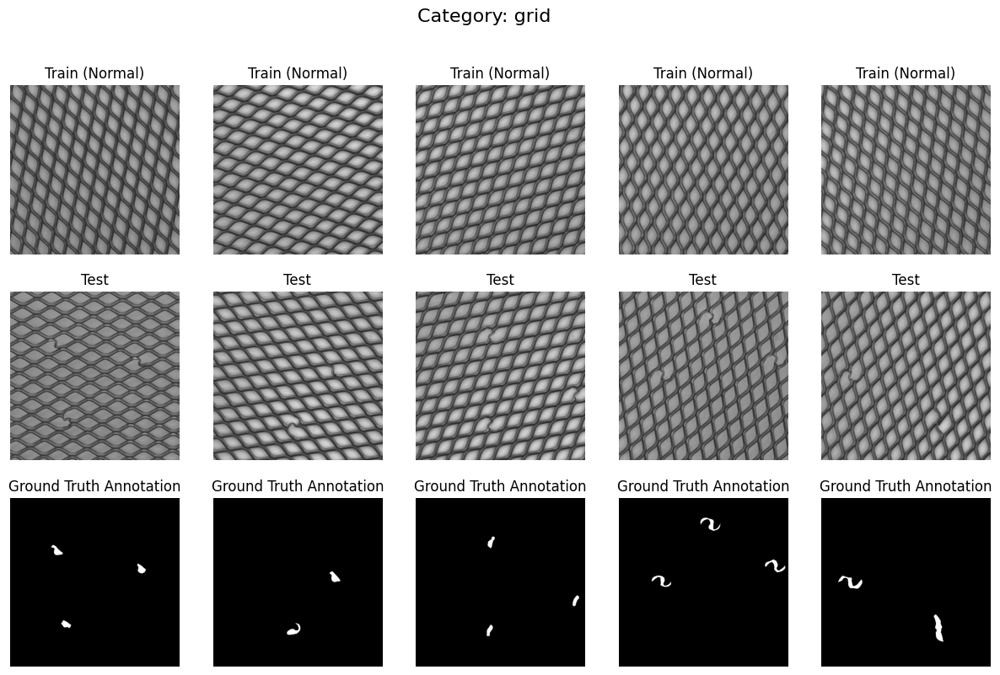

...

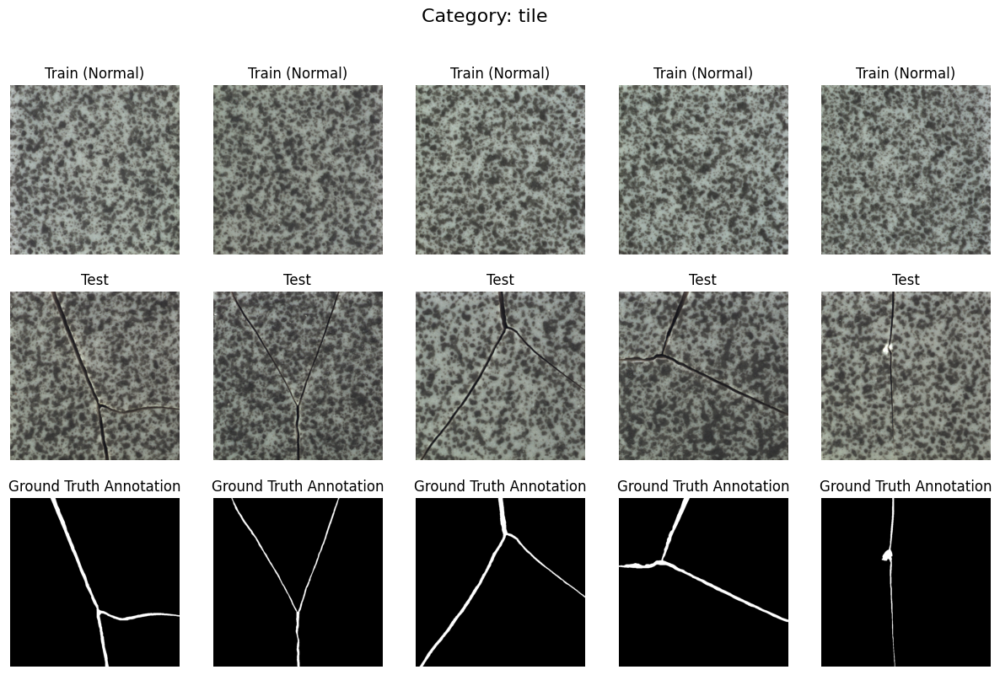

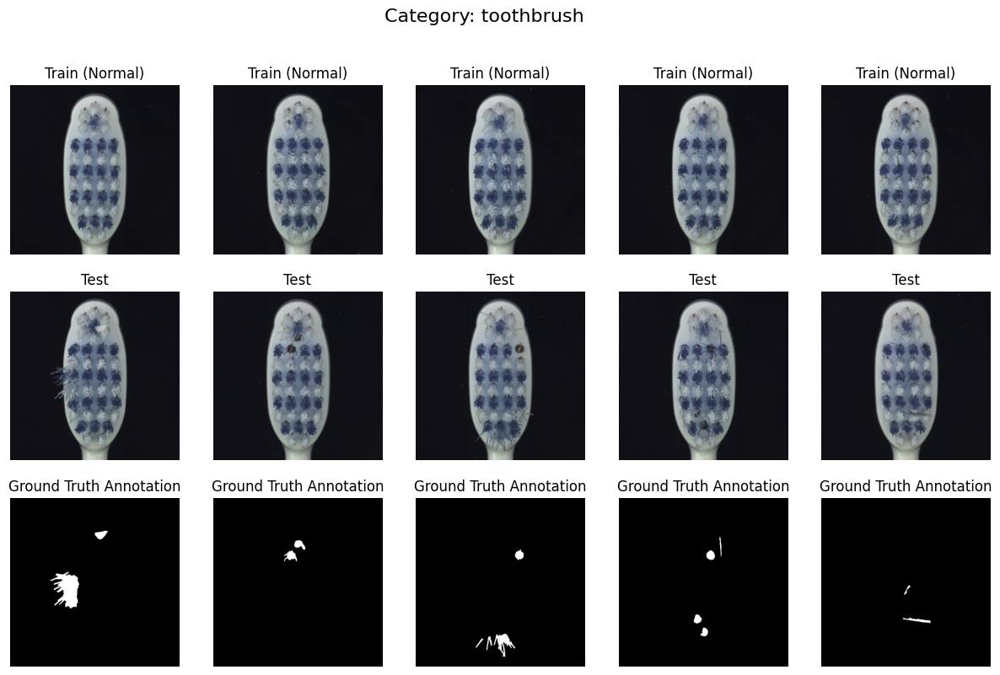

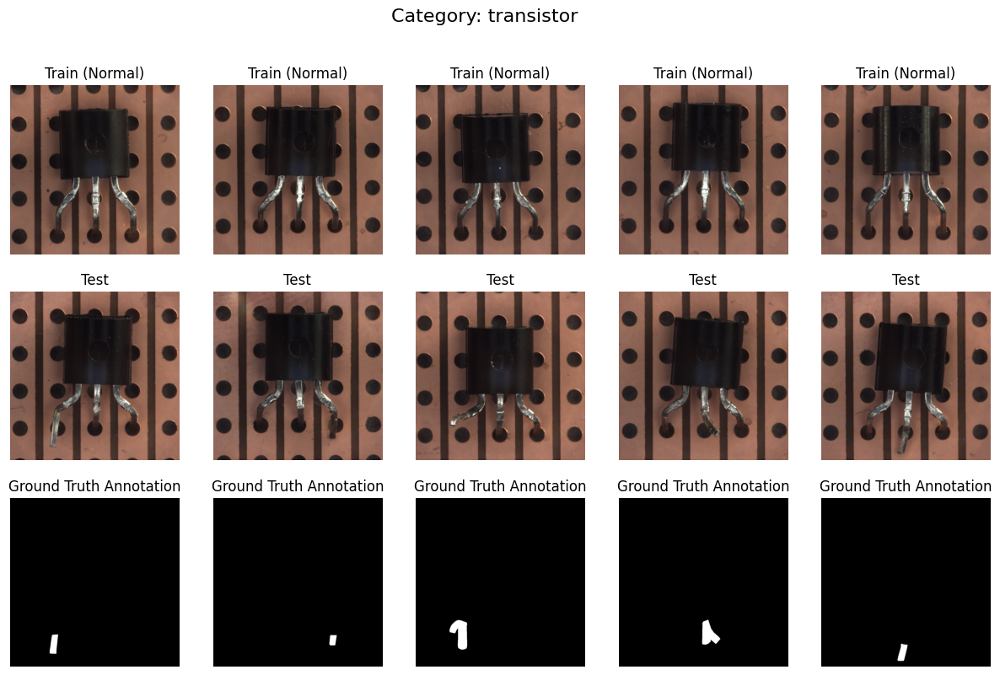

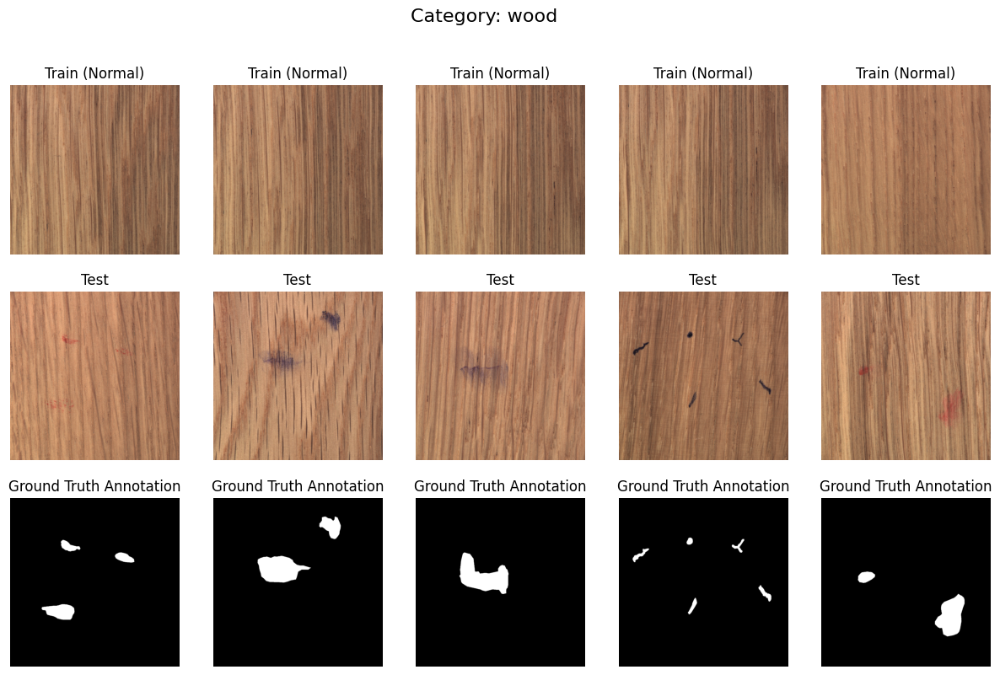

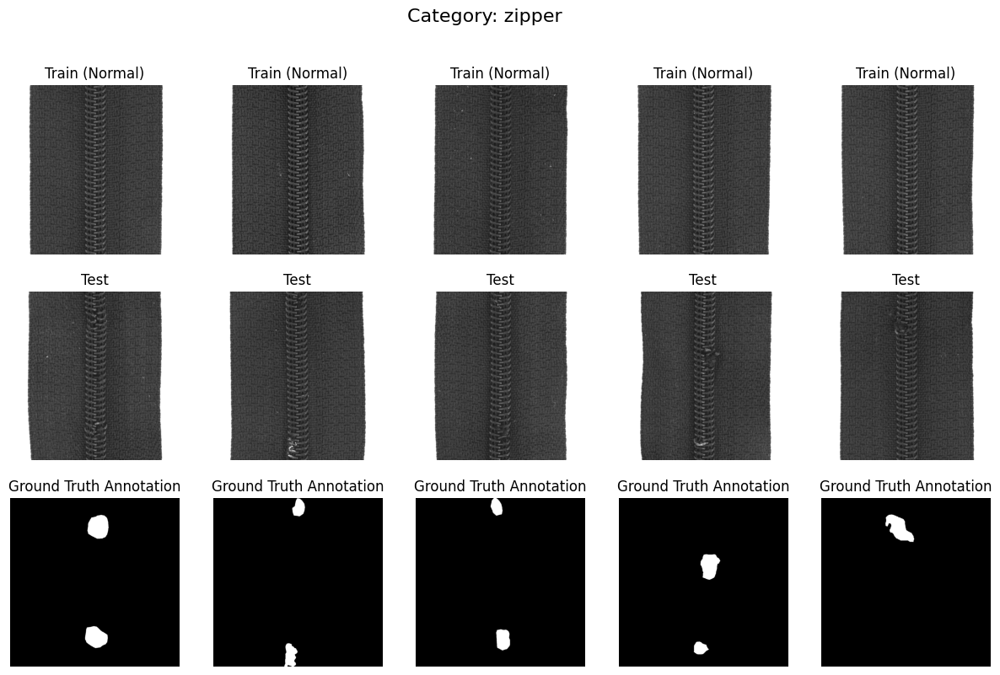

In [4]:
# Function to visualize images from a category along with ground truth annotations
def visualize_images_with_annotations(category, num_images=5):
    train_path = os.path.join(dataset_dir, category, 'train')
    test_path = os.path.join(dataset_dir, category, 'test')
    gt_path = os.path.join(dataset_dir, category, 'ground_truth')
    
    def get_image_paths(root_path):
        image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')
        image_paths = []
        for dirpath, _, filenames in os.walk(root_path):
            for filename in filenames:
                if filename.lower().endswith(image_extensions):
                    image_paths.append(os.path.join(dirpath, filename))
        return image_paths
    
    # Get image paths
    train_image_paths = get_image_paths(train_path)[:num_images]
    test_image_paths = get_image_paths(test_path)[:num_images]
    gt_image_paths = get_image_paths(gt_path)[:num_images]
    
    # Load images
    train_images = [cv2.imread(img_path) for img_path in train_image_paths]
    test_images = [cv2.imread(img_path) for img_path in test_image_paths]
    gt_images = [cv2.imread(img_path, cv2.IMREAD_GRAYSCALE) for img_path in gt_image_paths]
    
    # Plot images
    fig, axes = plt.subplots(3, num_images, figsize=(15, 9))
    fig.suptitle(f"Category: {category}", fontsize=16)
    for i in range(num_images):
        # Display train images
        if train_images[i] is not None:
            axes[0, i].imshow(cv2.cvtColor(train_images[i], cv2.COLOR_BGR2RGB))
        axes[0, i].set_title("Train (Normal)")
        axes[0, i].axis("off")
        
        # Display test images
        if test_images[i] is not None:
            axes[1, i].imshow(cv2.cvtColor(test_images[i], cv2.COLOR_BGR2RGB))
        axes[1, i].set_title("Test")
        axes[1, i].axis("off")
        
        # Display ground truth annotations
        if gt_images[i] is not None:
            axes[2, i].imshow(gt_images[i], cmap="gray")
        axes[2, i].set_title("Ground Truth Annotation")
        axes[2, i].axis("off")
    
    plt.show()

# Visualize a sample category
for category in categories:
    visualize_images_with_annotations(category)


In [5]:
# Function to get all image and ground_truth paths for all categories
def get_all_image_and_ground_truth_paths(category):
    train_path = os.path.join(dataset_dir, category, 'train')
    test_path = os.path.join(dataset_dir, category, 'test')
    gt_path = os.path.join(dataset_dir, category, 'ground_truth')
    
    def get_image_paths(root_path):
        image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')
        image_paths = []
        for dirpath, _, filenames in os.walk(root_path):
            for filename in filenames:
                if filename.lower().endswith(image_extensions):
                    image_paths.append(os.path.join(dirpath, filename))
        return image_paths
    
    def get_ground_truth_paths(root_path):
        ground_truth_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')
        ground_truth_paths = []
        for dirpath, _, filenames in os.walk(root_path):
            for filename in filenames:
                if filename.lower().endswith(ground_truth_extensions):
                    ground_truth_paths.append(os.path.join(dirpath, filename))
        return ground_truth_paths
    
    # Get image and ground_truth paths
    train_image_paths = get_image_paths(train_path)
    test_image_paths = get_image_paths(test_path)
    ground_truth_paths = get_ground_truth_paths(gt_path)
    
    return train_image_paths, test_image_paths, ground_truth_paths, train_image_paths+test_image_paths

# Get all image and ground_truth paths for all categories
train_image_paths = {}
test_image_paths = {}
image_paths = {}
ground_truth_paths = {}
for category in categories:
    train_image_paths[category], test_image_paths[category], ground_truth_paths[category], image_paths[category] = get_all_image_and_ground_truth_paths(category)




## *2. Metadata Extraction from Images*

In this section, we will extract various features from the images, such as average brightness, size, and color distributions. These features will be included in the DataFrame for further analysis.

### **2.1. Resizing of the images**

#### Explanation:

- This function resizes images to a fixed dimension of 224x224 pixels.
- It iterates over image paths grouped by category.
- Each image is read using cv2.imread and resized using cv2.resize.
- Resized images are stored in a dictionary, organized by category.
  
A checkpoint system is implemented to avoid recomputing resized images if they have already been processed.

If a checkpoint file exists, it loads the resized images from the file.
Otherwise, it calls the resize_images function to process the images and saves the results in a checkpoint file for future use.


In [6]:
import os
import pickle

# Function to resize images to 224x224
def resize_images(image_paths, target_size=(224, 224)):
    resized_images = {}
    for category, paths in image_paths.items():
        resized_images[category] = []
        for path in paths:
            image = cv2.imread(path)
            if image is not None:
                resized_image = cv2.resize(image, target_size)
                resized_images[category].append(resized_image)
    return resized_images

# Define the checkpoint file path
checkpoint_dir = os.path.join(os.path.dirname(os.path.abspath("__file__")), 'Checkpoints')
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_file = os.path.join(checkpoint_dir, 'resized_images_checkpoint.pkl')

# Check if the checkpoint file exists
if os.path.exists(checkpoint_file):
    # Load resized images from the checkpoint file
    with open(checkpoint_file, 'rb') as f:
        resized_images = pickle.load(f)
else:
    # Resize the images
    resized_images = resize_images(image_paths)
    
    # Save the resized images to the checkpoint file
    with open(checkpoint_file, 'wb') as f:
        pickle.dump(resized_images, f)

### **2.2. Extraction of general features**



This function extracts metadata from images such as:

- Category: The class or label assigned to the image.
- Set Type: Whether the image belongs to the training, testing, or validation dataset.
- Anomaly Status and Type: Whether the image is "normal" or "anomalous" and the type of anomaly.
- Dimensions and Aspect Ratio: The width, height, and aspect ratio of the image.
  
The function also determines attributes like set type and anomaly type based on the image file path.

- Like the resizing step, a checkpoint is used to save and load metadata to avoid redundant computations.
- Metadata is either loaded from a checkpoint file or freshly extracted using the extract_image_metadata function.
- The extracted metadata is converted into a pandas DataFrame for easier manipulation and analysis.
- This DataFrame organizes image attributes into a tabular format, making it convenient to visualize or process further.


In [7]:
import pickle

def extract_image_metadata(image_paths):
    metadata = []

    for category, paths in image_paths.items():
        for path in paths:
            if 'train' in path:
                set_type = 'train'
            elif 'test' in path:
                set_type = 'test'
            elif 'validation' in path:
                set_type = 'validation'
            else:
                set_type = 'unknown'

            if 'good' in path:
                anomaly_status = 'normal'
                anomaly_type = 'none'
            else:
                anomaly_status = 'anomalous'
                anomaly_type = os.path.basename(os.path.dirname(path))

            image = cv2.imread(path)
            if image is not None:
                height, width, _ = image.shape
                aspect_ratio = width / height

                metadata.append({
                    'category': category,
                    'set_type': set_type,
                    'anomaly_status': anomaly_status,
                    'anomaly_type': anomaly_type,
                    'width': width,
                    'height': height,
                    'aspect_ratio': aspect_ratio
                })

    return metadata

# Define the checkpoint file path
checkpoint_dir = os.path.join(os.path.dirname(os.path.abspath("__file__")), 'Checkpoints')
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_file = os.path.join(checkpoint_dir, 'image_metadata_checkpoint.pkl')

# Check if the checkpoint file exists
if os.path.exists(checkpoint_file):
    # Load metadata from the checkpoint file
    with open(checkpoint_file, 'rb') as f:
        image_metadata = pickle.load(f)
else:
    # Extract metadata from the image paths
    image_metadata = extract_image_metadata(image_paths)

    # Save the metadata to the checkpoint file
    with open(checkpoint_file, 'wb') as f:
        pickle.dump(image_metadata, f)

# Convert the metadata to a DataFrame
metadata_df = pd.DataFrame(image_metadata)
metadata_df


,category,set_type,anomaly_status,anomaly_type,width,height,aspect_ratio
0,bottle,train,normal,none,900,900,1.0
1,bottle,train,normal,none,900,900,1.0
2,bottle,train,normal,none,900,900,1.0
3,bottle,train,normal,none,900,900,1.0
4,bottle,train,normal,none,900,900,1.0
...,...,...,...,...,...,...,...
5349,zipper,test,anomalous,squeezed_teeth,1024,1024,1.0
5350,zipper,test,anomalous,squeezed_teeth,1024,1024,1.0
5351,zipper,test,anomalous,squeezed_teeth,1024,1024,1.0
5352,zipper,test,anomalous,squeezed_teeth,1024,1024,1.0


- The DataFrame contains 5354 rows, where each row represents metadata for a single image.
- All relevant metadata features have been extracted successfully and are ready for further analysis, such as anomaly detection or visualization.


## *3. Definition of Subclasses*

In this step, we classify each category into broader groups called subclasses. Subclasses help organize the dataset into more general types, which can aid in high-level analysis and visualization.


### **3.1. Subclass Definitions**
The subclasses are defined as follow


1. Texture-Based: Categories related to materials with distinctive textures, such as carpet, wood, tile, leather, and zipper.
2. Industrial Components: Categories related to mechanical or industrial components, including cable, transistor, screw, grid, and metal_nut.
3. Consumer Products: Categories representing everyday consumer items like bottle, capsule, and toothbrush.
4. Edible: Categories for food or consumable items, such as hazelnut and pill.

#### Procedure Explanations:

##### 1- Mapping Categories to Subclasses:

- A dictionary maps each category to one of the predefined subclasses. A lambda function is applied to the category column to assign the corresponding subclass.

- If a category is not found in the mapping, it is labeled as Unknown.

##### 2- Adding the Subclass Column:

- A new column, subclass, is added to the DataFrame, directly after the category column. This column shows the broader group each category belongs to.

##### 3- Reordering Columns:

- The column order in the DataFrame is adjusted to make the subclass column appear immediately after the category column for clarity.

In [8]:


# Define the subclasses for each category
subclasses = {
    'Texture-Based': ['carpet', 'wood', 'tile', 'leather', 'zipper'],
    'Industrial Components': ['cable', 'transistor', 'screw', 'grid', 'metal_nut'],
    'Consumer Products': ['bottle', 'capsule', 'toothbrush'],
    'Edible': ['hazelnut', 'pill']
}

# Add a new column to the DataFrame to store the subclass
metadata_df['subclass'] = metadata_df['category'].apply(
    lambda x: next((key for key, value in subclasses.items() if x in value), 'Unknown')
)

# Reorder columns to place 'subclass' after 'category'
cols = list(metadata_df.columns)
cols.insert(cols.index('category') + 1, cols.pop(cols.index('subclass')))
metadata_df = metadata_df[cols]

# Display the first few rows of the updated DataFrame
metadata_df


,category,subclass,set_type,anomaly_status,anomaly_type,width,height,aspect_ratio
0,bottle,Consumer Products,train,normal,none,900,900,1.0
1,bottle,Consumer Products,train,normal,none,900,900,1.0
2,bottle,Consumer Products,train,normal,none,900,900,1.0
3,bottle,Consumer Products,train,normal,none,900,900,1.0
4,bottle,Consumer Products,train,normal,none,900,900,1.0
...,...,...,...,...,...,...,...,...
5349,zipper,Texture-Based,test,anomalous,squeezed_teeth,1024,1024,1.0
5350,zipper,Texture-Based,test,anomalous,squeezed_teeth,1024,1024,1.0
5351,zipper,Texture-Based,test,anomalous,squeezed_teeth,1024,1024,1.0
5352,zipper,Texture-Based,test,anomalous,squeezed_teeth,1024,1024,1.0


## *4. Feature Extraction from Images*

This process involves extracting detailed characteristics (features) from images to facilitate further analysis, such as identifying patterns, distinguishing categories, or detecting anomalies. The extracted features include brightness, contrast, edges, texture, and structural properties.

### **4.1. Key Steps in Feature Extraction:**
#### Image Preparation:

- Images are converted to RGB format (if not already in this format).
- Grayscale versions of the images are created for specific operations, such as symmetry and edge detection.
  
#### Brightness and Contrast Calculation:

- The brightness and contrast for each color channel (Blue, Green, Red) are computed using the mean and standard deviation of pixel values, respectively.
- Luminance is calculated as a weighted sum of the brightness of the three color channels.

#### Edge Density:

- Edges are detected using the Canny edge detection algorithm, and the proportion of edge pixels (relative to total pixels) is calculated.

#### Symmetry Analysis:

- Horizontal symmetry is computed by comparing the grayscale image with its horizontally flipped version.
- Vertical symmetry is computed similarly using a vertically flipped version.

#### Gradient Features:

- Gradients along the X and Y axes (
𝐺
𝑥
G 
x
​
 , 
𝐺
𝑦
G 
y
​
 ) are computed using the Sobel operator.
- The mean and standard deviation of these gradients are used as features.

#### Shape Features:

- Binary thresholding is applied to detect objects.
- The largest detected object is analyzed for its bounding box area, aspect ratio, and perimeter.

#### Statistical Features:

- Intensity-based features include the mean, variance, entropy, mode, median, and quantiles of pixel intensities.
- A histogram of pixel intensities is also computed to derive certain features (e.g., mode).

#### Frequency Domain Features:

- The Fourier Transform is applied to the grayscale image to analyze frequency components.
- The mean and variance of magnitude in the frequency domain are calculated.

#### Structural Features:

- The Hough transform is used to detect lines, and the total line length is computed.
- Blob detection (using the Laplacian of Gaussian method) counts the number of blobs in the image.

#### Region-Based Features:

- The image is segmented using the watershed algorithm, and the region homogeneity (variation within segments) is measured.

#### Noise and Signal Properties:

- Noise level is estimated using the variance of pixel values.
- The signal-to-noise ratio (SNR) is calculated as the mean pixel intensity divided by the noise level.

The compute_features function calculates all the above features for an input image and returns them as a dictionary. For a set of images categorized by type (e.g., "bottle", "cable", etc.), the features are computed iteratively, and processing times for each category are recorded.

In [9]:
import numpy as np
import cv2
import pandas as pd
from skimage.measure import shannon_entropy
from numpy.fft import fft2, fftshift
from skimage.transform import hough_line, hough_line_peaks
from skimage.feature import blob_log
from skimage.filters import sobel
from skimage.segmentation import watershed
from skimage.restoration import estimate_sigma
import time
from tqdm import tqdm

# Function to compute various features for a given image
def compute_features(image):
    # Convert image to RGB if it is not already
    if len(image.shape) == 2 or image.shape[2] == 1:
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    
    # Compute brightness and contrast for each channel
    b_brightness = np.mean(image[:, :, 0])
    g_brightness = np.mean(image[:, :, 1])
    r_brightness = np.mean(image[:, :, 2])
    b_contrast = np.std(image[:, :, 0])
    g_contrast = np.std(image[:, :, 1])
    r_contrast = np.std(image[:, :, 2])
    luminance = 0.2126 * r_brightness + 0.7152 * g_brightness + 0.0722 * b_brightness
    
    # Compute edge density
    edges = cv2.Canny(image, 100, 200)
    edge_density = np.sum(edges) / (image.shape[0] * image.shape[1])
    
    # Compute symmetry
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    h_symmetry = np.mean(np.abs(gray_image - np.fliplr(gray_image)))
    v_symmetry = np.mean(np.abs(gray_image - np.flipud(gray_image)))
    
    # Compute gradient features
    gx = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)
    mean_grad_x = np.mean(gx)
    std_grad_x = np.std(gx)
    mean_grad_y = np.mean(gy)
    std_grad_y = np.std(gy)
    
    # Compute shape features
    _, binary = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    object_count = len(contours)
    if object_count > 0:
        largest = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest)
        bbox_area = w * h
        bbox_ar = w / h
        perimeter = cv2.arcLength(largest, True)
    else:
        x, y, w, h, bbox_area, bbox_ar, perimeter = 0, 0, 0, 0, 0, 0, 0
    
    # Compute statistical features
    mean_intensity = np.mean(gray_image)
    variance_intensity = np.var(gray_image)
    entropy = shannon_entropy(gray_image)
    hist = np.histogram(gray_image, bins=256, range=(0, 256))
    mode_intensity = hist[1][np.argmax(hist[0])]
    median_intensity = np.median(gray_image)
    quantiles_intensity = np.percentile(gray_image, [25, 50, 75])
    
    # Compute frequency domain features
    f_transform = fftshift(fft2(gray_image))
    mag = np.abs(f_transform)
    mean_magnitude = np.mean(mag)
    variance_magnitude = np.var(mag)
    
    # Compute structural features
    h, theta, d = hough_line(gray_image)
    _, angles, dists = hough_line_peaks(h, theta, d)
    line_length = np.sum(np.sqrt(np.diff(dists)**2 + np.diff(angles)**2)) if len(dists) > 1 else 0
    
    # Compute region-based features
    blobs = blob_log(gray_image, max_sigma=30, num_sigma=10, threshold=.1)
    blob_count = len(blobs)
    grad = sobel(gray_image)
    markers = np.zeros_like(gray_image)
    markers[gray_image < 30] = 1
    markers[gray_image > 150] = 2
    seg = watershed(grad, markers)
    region_homogeneity = np.mean([np.std(gray_image[seg == label]) for label in np.unique(seg)])
    
    # Compute noise features
    noise_level = estimate_sigma(gray_image)
    signal_to_noise_ratio = np.mean(gray_image) / noise_level if noise_level != 0 else 0
    
    return {
        'num_pixels_b': np.sum(image[:, :, 0]),
        'num_pixels_g': np.sum(image[:, :, 1]),
        'num_pixels_r': np.sum(image[:, :, 2]),
        'brightness_b': b_brightness,
        'brightness_g': g_brightness,
        'brightness_r': r_brightness,
        'contrast_b': b_contrast,
        'contrast_g': g_contrast,
        'contrast_r': r_contrast,
        'luminance': luminance,
        'edge_density': edge_density,
        'h_symmetry': h_symmetry,
        'v_symmetry': v_symmetry,
        'mean_grad_x': mean_grad_x,
        'std_grad_x': std_grad_x,
        'mean_grad_y': mean_grad_y,
        'std_grad_y': std_grad_y,
        'object_count': object_count,
        'bounding_box_area': bbox_area,
        'bounding_box_aspect_ratio': bbox_ar,
        'bounding_box_x': x,
        'bounding_box_y': y,
        'bounding_box_width': w,
        'bounding_box_height': h,
        'perimeter': perimeter,
        'mean_intensity': mean_intensity,
        'variance_intensity': variance_intensity,
        'entropy': entropy,
        'mode_intensity': mode_intensity,
        'median_intensity': median_intensity,
        'quantiles_intensity': quantiles_intensity.tolist(),
        'mean_magnitude': mean_magnitude,
        'variance_magnitude': variance_magnitude,
        'line_length': line_length,
        'blob_count': blob_count,
        'region_homogeneity': region_homogeneity,
        'noise_level': noise_level,
        'signal_to_noise_ratio': signal_to_noise_ratio
    }

# Extract features for all images in resized_images
image_features = []
category_times = {}
for category, images in resized_images.items():
    start_time = time.time()
    for image in tqdm(images, desc=f"Processing {category}"):
        features = compute_features(image)
        image_features.append(features)
    end_time = time.time()
    category_times[category] = end_time - start_time

# Convert the features to a DataFrame
features_df = pd.DataFrame(image_features)





Processing zipper: 100%|██████████| 391/391 [01:08<00:00,  5.69it/s]


#### Summary:
The extracted features are stored in a DataFrame with the following columns (partial list):

- num_pixels_b, num_pixels_g, num_pixels_r: Total pixel intensity values for Blue, Green, and Red channels.
- brightness_b, contrast_b, luminance: Brightness and contrast for Blue channel and overall luminance.
- edge_density, h_symmetry, v_symmetry: Edge and symmetry measures.
- mean_grad_x, bounding_box_area, perimeter: Gradient and shape-related metrics.
- entropy, mode_intensity, line_length, blob_count, noise_level: Statistical, structural, and noise-related features.

### **4.2. Features calculated in the Function**

#### 1. Color-Based Features (12)

- num_pixels_b, num_pixels_g, num_pixels_r
- brightness_b, brightness_g, brightness_r
- contrast_b, contrast_g, contrast_r
- luminance

#### 2. Edge and Symmetry Features (3)

- edge_density
- h_symmetry, v_symmetry

#### Gradient Features (4)

- mean_grad_x, std_grad_x
- mean_grad_y, std_grad_y
  
#### Shape Features (7)

- object_count
- bounding_box_area, bounding_box_aspect_ratio
- bounding_box_x, bounding_box_y
- bounding_box_width, bounding_box_height
- perimeter
  
#### Statistical Features (7)

- mean_intensity, variance_intensity, entropy
- mode_intensity, median_intensity, quantiles_intensity (a list of 3 values)

#### Frequency Domain Features (2)

- mean_magnitude, variance_magnitude

#### Structural Features (2)

- line_length
- blob_count

#### Region-Based Features (2)

- region_homogeneity

#### Noise and Signal Features (2)

- noise_level, signal_to_noise_ratio


### **4.3. Total Count**

#### Summing these up:

12 (Color) + 3 (Edge & Symmetry) + 4 (Gradient) + 7 (Shape) + 7 (Statistical) + 2 (Frequency) + 2 (Structural) + 2 (Region-Based) + 2 (Noise & Signal) = 41 features.

##### * Notes : If you count the quantiles_intensity (a list of 3 values) as separate features, the total becomes 43 features.


In [10]:
# Display the updated dataframe
features_df

,num_pixels_b,num_pixels_g,num_pixels_r,brightness_b,brightness_g,brightness_r,contrast_b,contrast_g,contrast_r,luminance,...,mode_intensity,median_intensity,quantiles_intensity,mean_magnitude,variance_magnitude,line_length,blob_count,region_homogeneity,noise_level,signal_to_noise_ratio
0,6999311,6773371,6821573,139.495197,134.992247,135.952906,88.838658,93.281950,93.297069,135.521596,...,255.0,86.0,"[58.0, 86.0, 255.0]",2469.977335,1.351567e+09,2309.700076,22,91.871780,0.822441,165.904582
1,7067411,6860049,6919208,140.852419,136.719727,137.898756,89.026791,93.360490,93.399923,137.268769,...,255.0,89.0,"[61.0, 89.0, 255.0]",2500.975681,1.374951e+09,2309.700076,27,91.970373,0.794046,173.905872
2,6960857,6767973,6819394,138.728815,134.884666,135.909479,88.881780,92.967929,93.062268,135.380089,...,255.0,86.0,"[61.0, 86.0, 255.0]",2716.201633,1.344393e+09,2309.700076,46,91.669753,0.840617,161.966231
3,6941894,6749162,6805319,138.350885,134.509766,135.628966,89.623201,93.683168,93.621707,135.025036,...,255.0,86.0,"[58.0, 86.0, 255.0]",2676.285369,1.346113e+09,2309.700076,27,92.367773,0.833964,162.824106
4,7080991,6879424,6930908,141.123067,137.105867,138.131936,89.361566,93.487153,93.427203,137.614051,...,255.0,90.0,"[61.0, 90.0, 255.0]",2557.740244,1.381014e+09,2309.700076,41,92.154055,0.790959,175.008753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5349,5008106,5008106,5008106,99.810786,99.810786,99.810786,81.603708,81.603708,81.603708,99.810786,...,255.0,62.0,"[52.0, 62.0, 77.0]",2629.990157,8.270764e+08,2309.700076,143,11.300364,4.083809,24.440611
5350,5101223,5101223,5101223,101.666594,101.666594,101.666594,80.924975,80.924975,80.924975,101.666594,...,255.0,64.0,"[54.0, 64.0, 80.0]",2668.235307,8.400997e+08,2309.700076,155,11.649471,4.320575,23.530804
5351,5007579,5007579,5007579,99.800283,99.800283,99.800283,83.398222,83.398222,83.398222,99.800283,...,255.0,61.0,"[50.0, 61.0, 78.0]",2600.491704,8.419825e+08,2309.700076,146,12.118417,4.015975,24.850821
5352,5086759,5086759,5086759,101.378328,101.378328,101.378328,84.407752,84.407752,84.407752,101.378328,...,255.0,61.0,"[50.0, 61.0, 82.0]",2643.858035,8.661845e+08,2309.700076,143,11.671552,4.066938,24.927434


## *5. Pixel Feature Extraction and Dataset Preparation*
This document outlines the process of extracting pixel-level features from images, computing statistical and other image features, and combining them into a comprehensive dataset for further analysis.

### **5.1. Extracting Pixel Features**

Pixel-level data were extracted from images resized to 224x224x3 (height, width, and RGB channels). Each image contains 150,528 pixels. The pixel values were processed in batches using GPU acceleration with PyTorch for efficiency.



#### Explanations:

1-   "Input Data": The resized_images dictionary contains images grouped by their respective categories (e.g., bottle, capsule).

2-   "Batch Processing": Images were processed in batches (default batch size = 32) to leverage GPU acceleration.

3-   "Flattening Pixels": Each image was converted into a flattened array of size 150,528 (224 × 224 × 3) and stored in a structured format.

4-   "Output Format": A pandas DataFrame was created, where each row corresponds to an image, and each column represents a pixel (e.g., pixel_1, pixel_2, ..., pixel_150528).

#### Output:
- Rows: Each row corresponds to an image.
- Columns: Each column corresponds to a pixel, with a total of 150,528 columns.


In [11]:
import torch
from tqdm import tqdm
import time
import numpy as np
import pandas as pd

# Function to extract pixel values from images using CUDA and batching
def extract_pixel_values_cuda_batched(resized_images, batch_size=32):
    pixel_data = []
    
    for category, images in resized_images.items():
        num_images = len(images)
        for i in tqdm(range(0, num_images, batch_size), desc=f"Processing {category}"):
            batch_images = images[i:i+batch_size]
            
            # Convert batch of images to a single numpy array
            batch_array = np.array(batch_images)
            
            # Convert numpy array to tensor and move to GPU
            batch_tensor = torch.tensor(batch_array, device='cuda')
            
            # Flatten the batch tensor and convert to list
            batch_pixel_values = batch_tensor.view(batch_tensor.size(0), -1).cpu().tolist()
            pixel_data.extend(batch_pixel_values)
    
    # Create a DataFrame with pixel values
    columns = [f'pixel_{i+1}' for i in range(len(pixel_data[0]))]
    pixel_df = pd.DataFrame(pixel_data, columns=columns)
    
    return pixel_df

# Extract pixel values and create DataFrame
pixel_df = extract_pixel_values_cuda_batched(resized_images)

# Display the first few rows of the DataFrame
pixel_df

Processing zipper: 100%|██████████| 13/13 [00:00<00:00, 25.79it/s]


,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,pixel_10,...,pixel_150519,pixel_150520,pixel_150521,pixel_150522,pixel_150523,pixel_150524,pixel_150525,pixel_150526,pixel_150527,pixel_150528
0,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
1,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
2,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
3,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
4,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5349,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
5350,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
5351,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
5352,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255


### **5.2. Extracting Statistical Features**

In addition to raw pixel data, a wide range of statistical and shape-based features were computed, such as:

- Color Features:
  
   Mean brightness, contrast, and pixel counts across RGB channels.
- Edge & Gradient Features:
  
   Horizontal and vertical gradients, edge density, and symmetry measures.
- Shape Features:
  
   Object counts, bounding box dimensions, and perimeter calculations.

- Frequency and Noise Analysis:
   Mean and variance in frequency magnitude, signal-to-noise ratio, and noise levels.

   
These features were extracted and stored in a separate DataFrame (features_df).

#### Output datafreame structure


- Rows: Each row corresponds to an image.
  
- Columns: Approximately 40 statistical features such as:
mean_intensity, contrast_b, object_count, region_homogeneity, etc.


In [12]:
# Split the 'quantiles_intensity' column into three separate columns
quantiles_df = pd.DataFrame(features_df['quantiles_intensity'].tolist(), columns=['quantile_25', 'quantile_50', 'quantile_75'])

# Concatenate the new quantile columns with the original dataframe
features_df = pd.concat([features_df, quantiles_df], axis=1)

# Drop the original 'quantiles_intensity' column
features_df.drop(columns=['quantiles_intensity'], inplace=True)

# Display the updated dataframe
features_df

,num_pixels_b,num_pixels_g,num_pixels_r,brightness_b,brightness_g,brightness_r,contrast_b,contrast_g,contrast_r,luminance,...,mean_magnitude,variance_magnitude,line_length,blob_count,region_homogeneity,noise_level,signal_to_noise_ratio,quantile_25,quantile_50,quantile_75
0,6999311,6773371,6821573,139.495197,134.992247,135.952906,88.838658,93.281950,93.297069,135.521596,...,2469.977335,1.351567e+09,2309.700076,22,91.871780,0.822441,165.904582,58.0,86.0,255.0
1,7067411,6860049,6919208,140.852419,136.719727,137.898756,89.026791,93.360490,93.399923,137.268769,...,2500.975681,1.374951e+09,2309.700076,27,91.970373,0.794046,173.905872,61.0,89.0,255.0
2,6960857,6767973,6819394,138.728815,134.884666,135.909479,88.881780,92.967929,93.062268,135.380089,...,2716.201633,1.344393e+09,2309.700076,46,91.669753,0.840617,161.966231,61.0,86.0,255.0
3,6941894,6749162,6805319,138.350885,134.509766,135.628966,89.623201,93.683168,93.621707,135.025036,...,2676.285369,1.346113e+09,2309.700076,27,92.367773,0.833964,162.824106,58.0,86.0,255.0
4,7080991,6879424,6930908,141.123067,137.105867,138.131936,89.361566,93.487153,93.427203,137.614051,...,2557.740244,1.381014e+09,2309.700076,41,92.154055,0.790959,175.008753,61.0,90.0,255.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5349,5008106,5008106,5008106,99.810786,99.810786,99.810786,81.603708,81.603708,81.603708,99.810786,...,2629.990157,8.270764e+08,2309.700076,143,11.300364,4.083809,24.440611,52.0,62.0,77.0
5350,5101223,5101223,5101223,101.666594,101.666594,101.666594,80.924975,80.924975,80.924975,101.666594,...,2668.235307,8.400997e+08,2309.700076,155,11.649471,4.320575,23.530804,54.0,64.0,80.0
5351,5007579,5007579,5007579,99.800283,99.800283,99.800283,83.398222,83.398222,83.398222,99.800283,...,2600.491704,8.419825e+08,2309.700076,146,12.118417,4.015975,24.850821,50.0,61.0,78.0
5352,5086759,5086759,5086759,101.378328,101.378328,101.378328,84.407752,84.407752,84.407752,101.378328,...,2643.858035,8.661845e+08,2309.700076,143,11.671552,4.066938,24.927434,50.0,61.0,82.0


### **5.3. Concatenating Features**

To create a unified dataset, the following three DataFrames were concatenated:

1. Metadata: Image-level details like category, subclass, width, height, and aspect ratio.
2. Statistical Features: Previously computed color, edge, gradient, and shape-based features.
3. Pixel Features: Flattened pixel data (150,528 columns).

#### Key Steps:

- The three DataFrames were concatenated along their columns using pd.concat, ensuring that rows align properly across all datasets.
- The resulting DataFrame contained both high-level features (e.g., object count, symmetry) and raw pixel values, providing a comprehensive representation of each image.

Concatenate the 3 dataframes into one dataframe

### **5.4. Final Dataset Structure:**

- Rows: Each row corresponds to a single image.

- Columns:
  
  -   Metadata: category, set_type, anomaly_status, etc.
  -   Statistical Features: Approximately 40 columns.
  -   Pixel Features: 150,528 columns.

In [13]:
# Concatenate the three dataframes along the columns
train_test_df = pd.concat([metadata_df, features_df, pixel_df], axis=1)

# Display the first few rows of the concatenated dataframe
train_test_df.head()

,category,subclass,set_type,anomaly_status,anomaly_type,width,height,aspect_ratio,num_pixels_b,num_pixels_g,...,pixel_150519,pixel_150520,pixel_150521,pixel_150522,pixel_150523,pixel_150524,pixel_150525,pixel_150526,pixel_150527,pixel_150528
0,bottle,Consumer Products,train,normal,none,900,900,1.0,6999311,6773371,...,255,255,255,255,255,255,255,255,255,255
1,bottle,Consumer Products,train,normal,none,900,900,1.0,7067411,6860049,...,255,255,255,255,255,255,255,255,255,255
2,bottle,Consumer Products,train,normal,none,900,900,1.0,6960857,6767973,...,255,255,255,255,255,255,255,255,255,255
3,bottle,Consumer Products,train,normal,none,900,900,1.0,6941894,6749162,...,255,255,255,255,255,255,255,255,255,255
4,bottle,Consumer Products,train,normal,none,900,900,1.0,7080991,6879424,...,255,255,255,255,255,255,255,255,255,255


## *6.Synthetic Data Generation and Validation Dataset Creation for Anomaly Detection*

This document explains the process of generating synthetic anomaly images, their corresponding ground truth masks, and creating a labeled validation dataset. The steps utilize various image transformations and blends synthetic anomalies into the images for anomaly detection tasks.



### **6.1. Synthetic Data Generation**

The synthetic anomalies are created using the generate_nsa_images function. Below is a step-by-step explanation of the process.

--------------- Function: generate_nsa_images --------------

This function creates synthetic anomalies in images by applying transformations, cropping, blending, and other image manipulations.


#### Steps in the Function:

##### 1. Object Mask Creation (get_object_mask)

- Converts the image to grayscale.
- Applies thresholding to separate the object from the background.

##### 2. Random Object Crop (random_object_crop)

- Crops a random region from the object area, based on the category.
- Specific regions are targeted for certain categories:
  - screw and capsule: Centered crop.
  - transistor: Lower center crop.
  - Other categories: Random overlapping crop based on object area.

##### 3. Applying Transformations (apply_transformations)

- Rotates the cropped region (higher angles for specific categories like hazelnut).
- Scales the cropped region with category-specific scaling factors.
- Adds noise (Gaussian, salt-and-pepper) and brightness adjustments.
- Applies a spiral distortion to simulate geometric changes.

##### 4. Blending with Poisson Editing (poisson_blend)

- Seamlessly integrates the cropped, transformed anomaly back into the original image using Poisson blending.

##### 5. Ground Truth Mask Creation

- A binary mask highlights the region where the synthetic anomaly is blended.

#### Outputs:

  - synthetic_images_dict: Contains modified images with anomalies.
  - ground_truth_masks_dict: Corresponding binary masks.
  - labels_dict: Labels (1 for modified, 0 for normal).


In [14]:
import numpy as np
from PIL import Image
import cv2
import random

def generate_nsa_images(image_paths_dict, threshold_image=40):
    """
    Generate synthetic anomalies via enhanced NSA:
    1) Use thresholding to separate the object from the background.
    2) Randomly crop a region from the object area.
    3) Rotate the cropped region.
    4) Apply additional transformations (scaling, noise).
    5) Blend the cropped region back into the image using Poisson image editing.
    6) Return a list of synthetic images with anomalies and their ground truth masks.
    
    Parameters:
        image_paths_dict (dict): Dictionary of paths to normal images for each category.
        threshold_image (int): Grayscale intensity threshold for separating object and background.

    Returns:
        synthetic_images_dict (dict): Dictionary of synthetic images with anomalies for each category.
        ground_truth_masks_dict (dict): Dictionary of ground truth masks for the synthetic anomalies for each category.
        labels_dict (dict): Dictionary of labels indicating whether the image was modified (1) or not (0).
    """
    def get_object_mask(image, threshold):
        """
        Create a binary mask to separate the object from the background.
        """
        grayscale = np.array(image.convert("L"))  # Convert to grayscale
        _, mask = cv2.threshold(grayscale, threshold, 255, cv2.THRESH_BINARY)  # Apply threshold
        return mask

    def random_object_crop(image, mask, category):
        """
        Randomly crop a region from the object area based on the mask.
        For 'screw' and 'capsule' categories, crop only the center of the images.
        For 'transistor' category, crop only the lower center part of the images.
        """
        height, width = mask.shape
        if category in ['screw', 'capsule']:
            crop_width = np.random.randint(150, 200)
            crop_height = np.random.randint(150, 200)
            left = (width - crop_width) // 2
            top = (height - crop_height) // 2
            right = left + crop_width
            bottom = top + crop_height
            return image.crop((left, top, right, bottom)), (left, top, right, bottom)
        elif category == 'transistor':
            crop_width = np.random.randint(150, 200)
            crop_height = np.random.randint(150, 200)
            left = (width - crop_width) // 2 + np.random.randint(-50, 50)
            top = height - crop_height - np.random.randint(0, 50)
            right = left + crop_width
            bottom = top + crop_height
            return image.crop((left, top, right, bottom)), (left, top, right, bottom)
        else:
            while True:
                crop_width = np.random.randint(150, 200)
                crop_height = np.random.randint(150, 200)
                left = np.random.randint(0, width - crop_width)
                top = np.random.randint(0, height - crop_height)
                right = left + crop_width
                bottom = top + crop_height

                # Check if the cropped region overlaps significantly with the object
                crop_mask = mask[top:bottom, left:right]
                if crop_mask.mean() > 233:  # 90% overlap with object (255 * 0.9 = 229.5)
                    return image.crop((left, top, right, bottom)), (left, top, right, bottom)

    def apply_transformations(crop, category):
        """
        Apply additional transformations to the cropped region.
        """
        # Increase rotation angle for hazelnut category
        if category == 'hazelnut':
            crop = crop.rotate(np.random.randint(-90, 90))
        else:
            crop = crop.rotate(np.random.randint(-45, 45))
        
        # Increase scaling factor for hazelnut category
        if category == 'hazelnut':
            scale_factor = np.random.uniform(1.5, 2.0)
        else:
            scale_factor = np.random.uniform(1.0, 1.5)
        crop = crop.resize((int(crop.width * scale_factor), int(crop.height * scale_factor)))

        # Increase noise intensity for hazelnut category
        crop_np = np.array(crop)
        if category == 'hazelnut':
            noise = np.random.normal(0, 5, crop_np.shape).astype(np.uint8)
        else:
            noise = np.random.normal(0, 2, crop_np.shape).astype(np.uint8)
        crop_np = cv2.addWeighted(crop_np, 0.9, noise, 0.2, 0)

        # Apply spiral distortion
        rows, cols, ch = crop_np.shape
        map_x, map_y = np.meshgrid(np.arange(cols), np.arange(rows))
        map_x = map_x.astype(np.float32)
        map_y = map_y.astype(np.float32)

        center_x, center_y = cols // 2, rows // 2
        spiral_x = np.zeros_like(map_x)
        spiral_y = np.zeros_like(map_y)
        for i in range(rows):
            for j in range(cols):
                dx = j - center_x
                dy = i - center_y
                distance = np.sqrt(dx**2 + dy**2)
                angle = np.arctan2(dy, dx) + distance / 15  # Increased spiral factor
                spiral_x[i, j] = center_x + distance * np.cos(angle)
                spiral_y[i, j] = center_y + distance * np.sin(angle)

        crop_np = cv2.remap(crop_np, spiral_x, spiral_y, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)

        

        # Make the cropped area 50% darker or 50% lighter randomly
        if random.random() < 0.5:
            crop_np = cv2.add(crop_np, -50)  # Make darker
        else:
            crop_np = cv2.addWeighted(crop_np, 1.5, np.zeros_like(crop_np), 0, 0)  # Make lighter

        # Apply salt and pepper noise
        s_vs_p = 0.5
        amount = 0.004
        out = np.copy(crop_np)
        # Salt mode
        num_salt = np.ceil(amount * crop_np.size * s_vs_p)
        coords = [np.random.randint(0, i - 1, int(num_salt)) for i in crop_np.shape]
        out[coords[0], coords[1], :] = 1

        # Pepper mode
        num_pepper = np.ceil(amount * crop_np.size * (1.0 - s_vs_p))
        coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in crop_np.shape]
        out[coords[0], coords[1], :] = 0

        # 50% chance to make the image more opaque or more black
        if random.random() < 0.5:
            # Make the image more opaque
            out = cv2.addWeighted(out, 0.5, np.zeros_like(out), 0.5, 0)
        else:
            # Make the image more black
            out = cv2.addWeighted(out, 0.5, np.zeros_like(out), 0.5, 0)

        return Image.fromarray(out)

    def poisson_blend(image, crop, mask, region):
        """
        Perform Poisson image editing to blend the cropped region into the image seamlessly.
        """
        left, top, right, bottom = region
        center = (left + (right - left) // 2, top + (bottom - top) // 2)

        # Convert images to OpenCV format
        img_cv = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        crop_cv = cv2.cvtColor(np.array(crop), cv2.COLOR_RGB2BGR)
        mask_cv = mask[top:bottom, left:right]

        # Ensure the mask matches the crop size
        mask_resized = cv2.resize(mask_cv, (crop_cv.shape[1], crop_cv.shape[0]), interpolation=cv2.INTER_NEAREST)

        # Ensure the crop region is within the bounds of the original image
        crop_width, crop_height = crop_cv.shape[1], crop_cv.shape[0]
        left = max(0, min(left, img_cv.shape[1] - crop_width))
        top = max(0, min(top, img_cv.shape[0] - crop_height))
        right = left + crop_width
        bottom = top + crop_height
        center = (left + crop_width // 2, top + crop_height // 2)

        # Apply Poisson blending
        blended = cv2.seamlessClone(crop_cv, img_cv, mask_resized, center, cv2.MIXED_CLONE)

        # Convert back to PIL format
        return Image.fromarray(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))

    synthetic_images_dict = {}
    ground_truth_masks_dict = {}
    labels_dict = {}

    for category, img_paths in image_paths_dict.items():
        synthetic_images = []
        ground_truth_masks = []
        labels = []

        for img_path in img_paths:
            img = Image.open(img_path).convert('RGB')

            # Generate object mask using thresholding
            object_mask = get_object_mask(img, threshold_image)

            # Randomly crop a region from the object
            cropped_img, region = random_object_crop(img, object_mask, category)
            cropped_img = apply_transformations(cropped_img, category)

            # Blend the modified crop back into the image
            synthetic_img = poisson_blend(img, cropped_img, object_mask, region)
            synthetic_images.append(synthetic_img)

            # Create ground truth mask for the synthetic anomaly
            gt_mask = np.zeros_like(object_mask)
            left, top, right, bottom = region
            gt_mask[top:bottom, left:right] = 255
            ground_truth_masks.append(Image.fromarray(gt_mask))

            # Label as modified
            labels.append(1)

        synthetic_images_dict[category] = synthetic_images
        ground_truth_masks_dict[category] = ground_truth_masks
        labels_dict[category] = labels

    return synthetic_images_dict, ground_truth_masks_dict, labels_dict


### **6.2. Visualization**

To visualize the synthetic anomalies and their corresponding ground truth masks:

Category: bottle


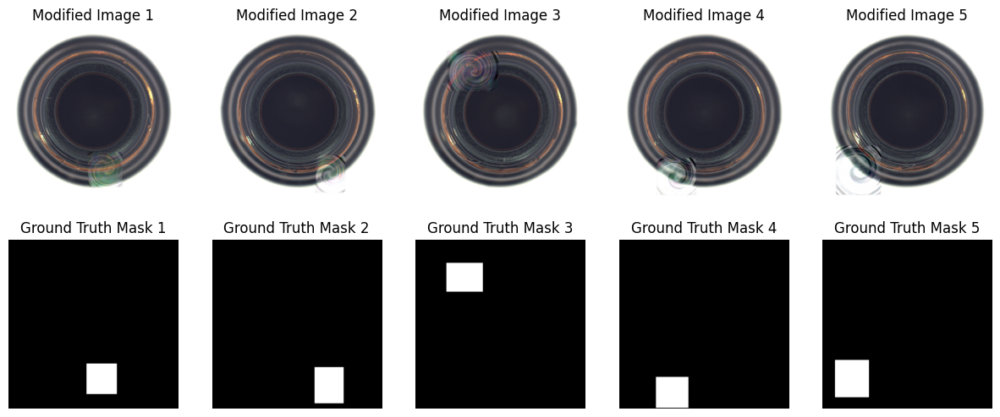

Category: cable


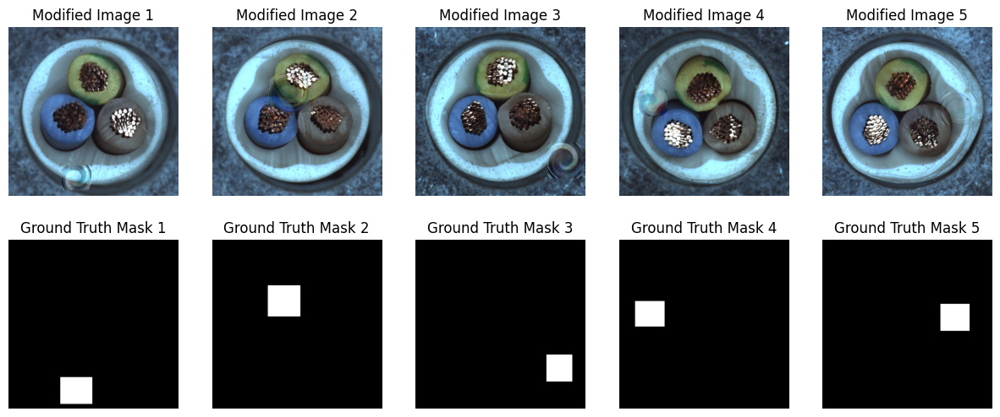

Category: capsule


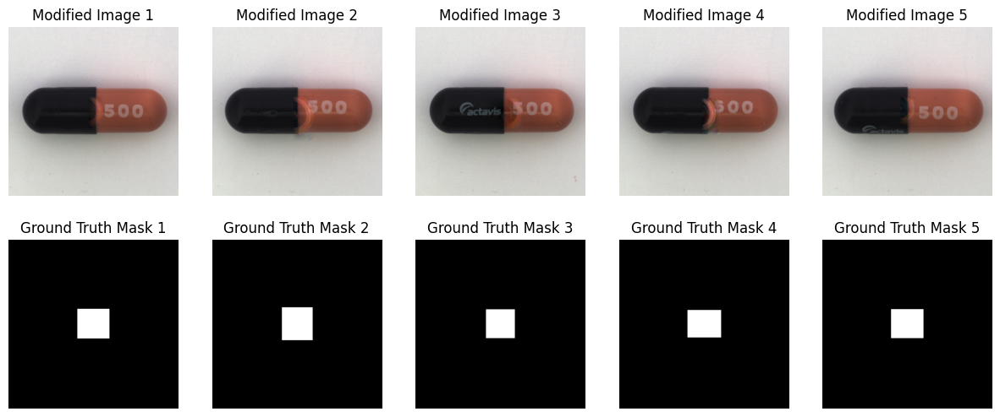

Category: carpet


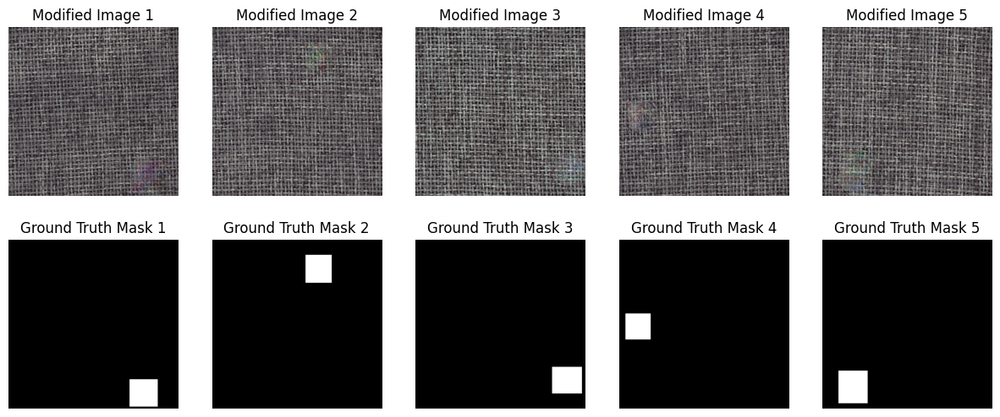

Category: grid


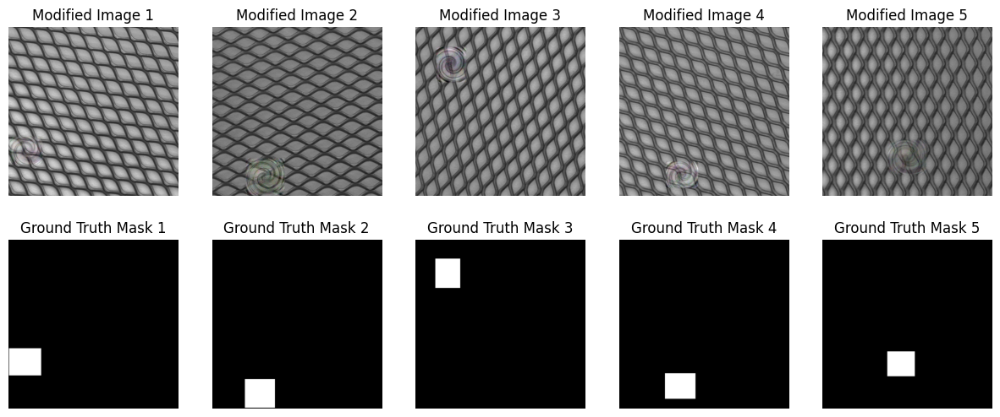

Category: hazelnut


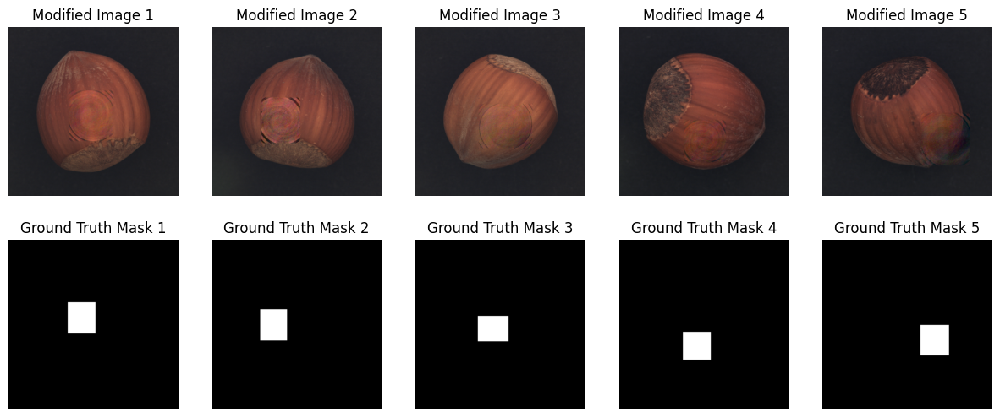

Category: leather


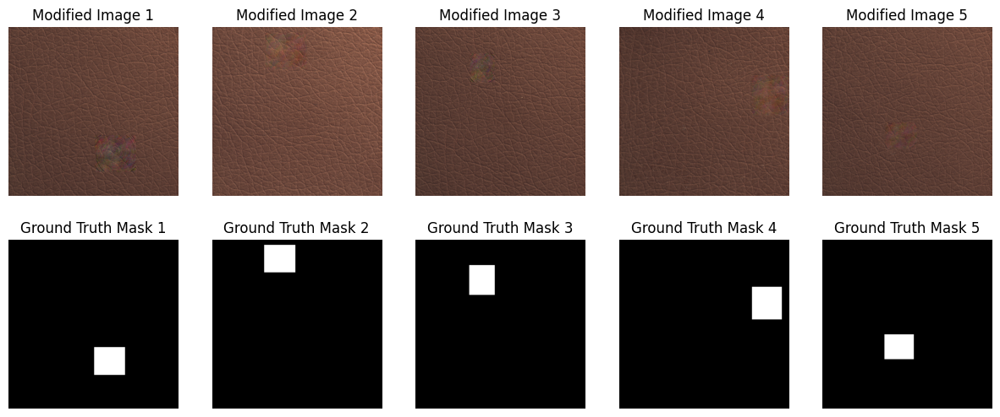

Category: metal_nut


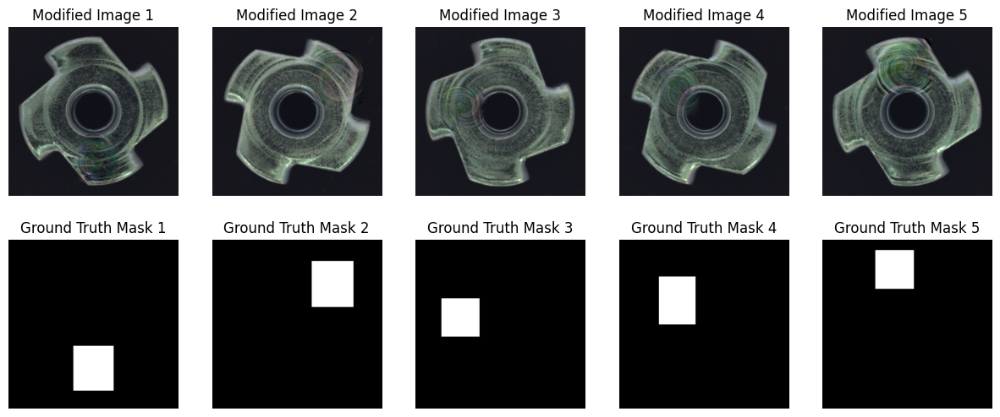

Category: pill


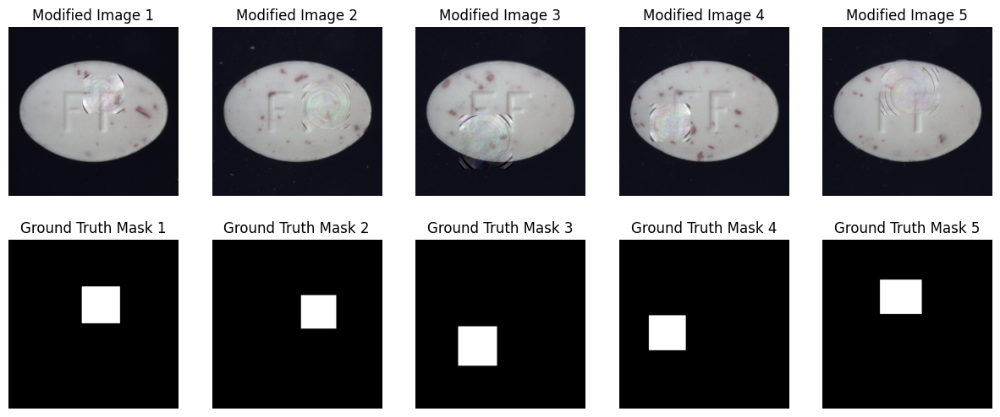

Category: screw


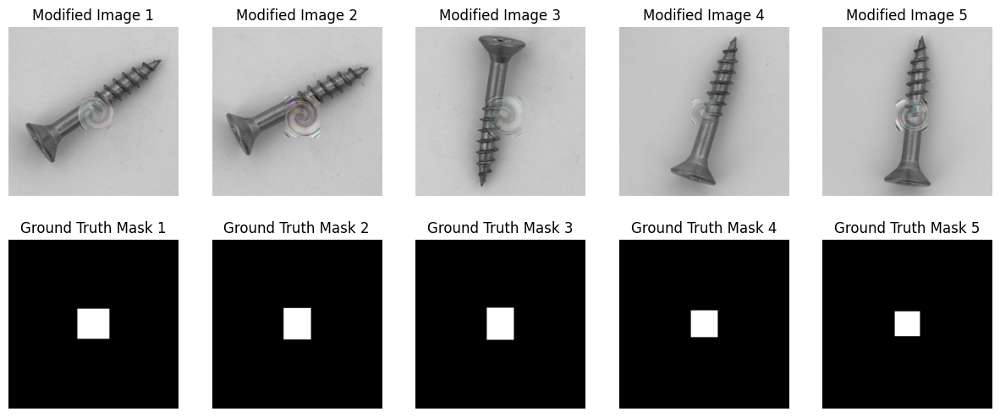

Category: tile


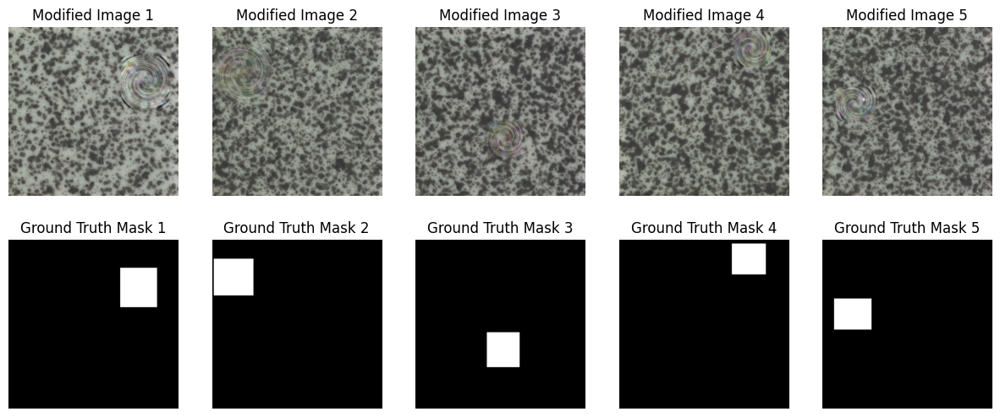

Category: toothbrush


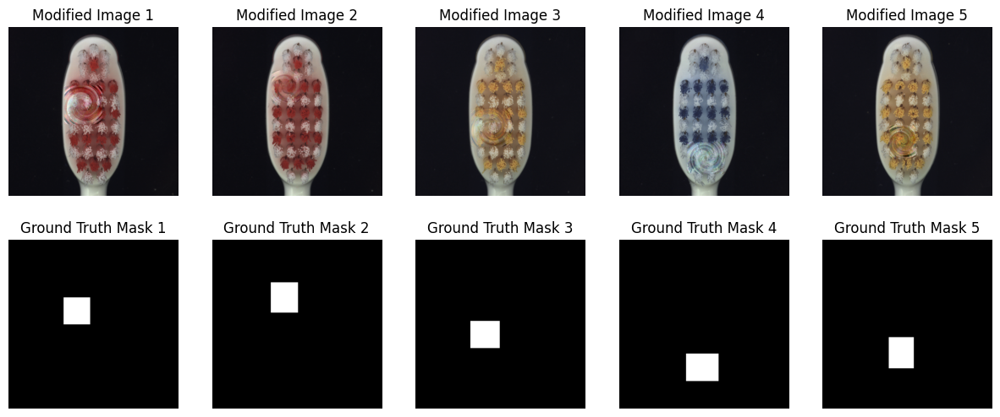

Category: transistor


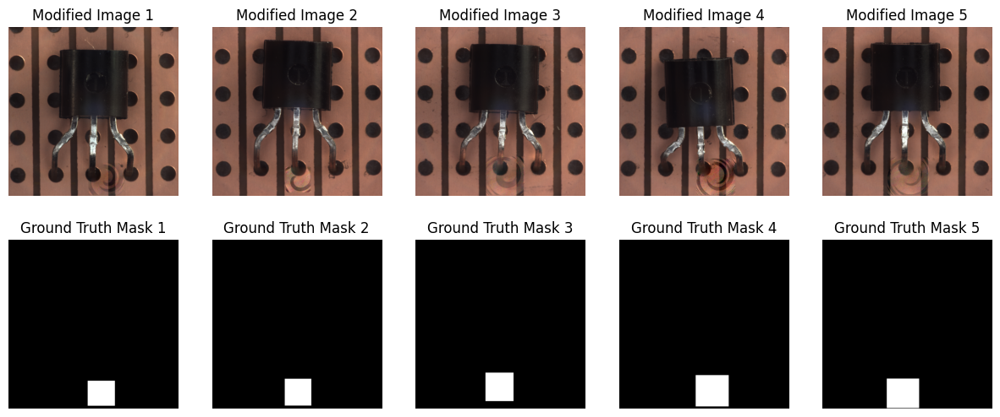

Category: wood


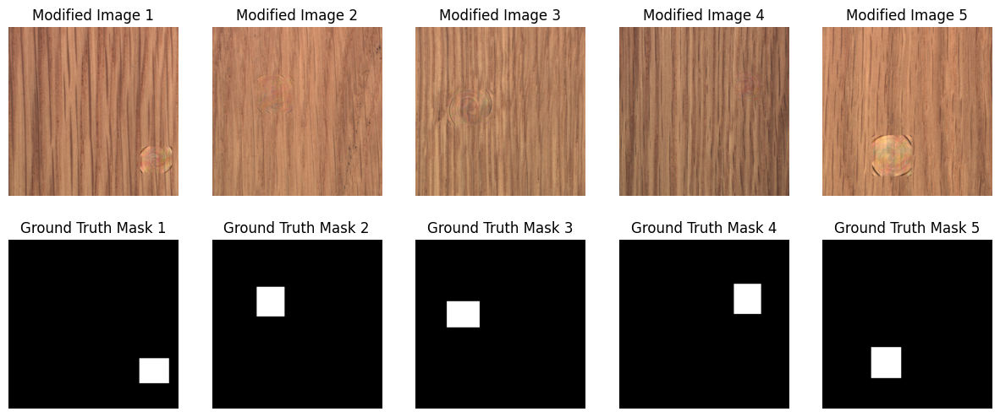

Category: zipper


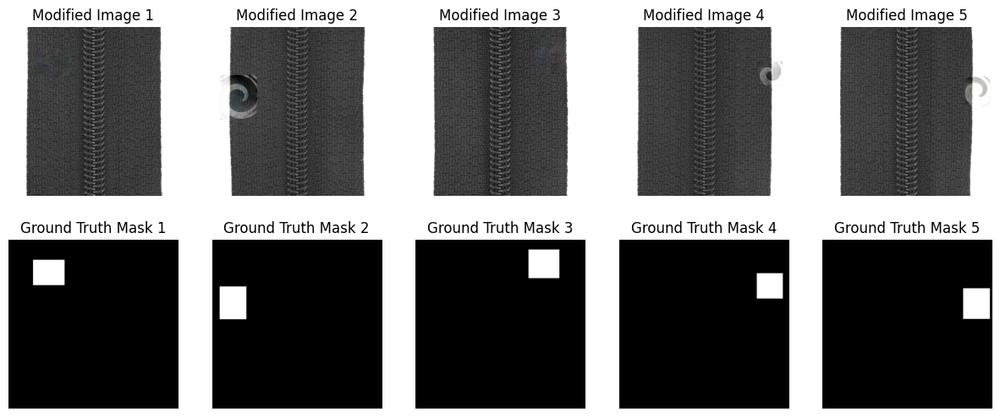

In [15]:
# Randomly select 5 images from the train set for each category
sample_train_images_dict = {category: random.sample(paths, 5) for category, paths in train_image_paths.items()}

# Generate synthetic anomalies for the selected train images
synthetic_train_images_dict, synthetic_train_masks_dict, synthetic_train_labels_dict = generate_nsa_images(sample_train_images_dict, threshold_image=40)

# Print the modified images and their ground truth masks in a grid with 5 columns and 2 rows
for category, images in synthetic_train_images_dict.items():
    print(f"Category: {category}")
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    for i in range(5):
        # Display modified images in the first row
        axes[0, i].imshow(images[i])
        axes[0, i].set_title(f"Modified Image {i+1}")
        axes[0, i].axis('off')
        
        # Display ground truth masks in the second row
        axes[1, i].imshow(synthetic_train_masks_dict[category][i], cmap='gray')
        axes[1, i].set_title(f"Ground Truth Mask {i+1}")
        axes[1, i].axis('off')
    
    plt.show()

## *7. Creation of Validation Dataset*

The validation dataset is created by splitting the training dataset and applying synthetic anomalies.


#### Steps:

### **7.1. Train-Validation Split**

- Split the training dataset into train and validation sets (60%-40%).
- Each category is split independently using train_test_split.

In [16]:
from sklearn.model_selection import train_test_split

# Split the train dataset into train and validation sets for each category
train_images_dict_2 = {}
validation_images_dict = {}

for category in categories:
    train_image_paths_2, validation_image_paths = train_test_split(
        train_image_paths[category], test_size=0.4, random_state=42
    )
    train_images_dict_2[category] = train_image_paths_2
    validation_images_dict[category] = validation_image_paths




### **7.2. Generate Synthetic Validation Data**

- For each category:
  - 75% of validation images are transformed with synthetic anomalies.
    - 25% of validation images remain normal.

- Labels:
  - 1 for images with synthetic anomalies.
  - 0 for normal images.



In [33]:
import os
import pickle
import random

# Define the checkpoint file path
checkpoint_dir = os.path.join(os.path.dirname(os.path.abspath("__file__")), 'Checkpoints')
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_file = os.path.join(checkpoint_dir, 'synthetic_val_images_checkpoint.pkl')

# Check if the checkpoint file exists
if os.path.exists(checkpoint_file):
    # Load dictionaries from the checkpoint file
    with open(checkpoint_file, 'rb') as f:
        val_images_dict, val_masks_dict, val_labels_dict = pickle.load(f)
else:
    val_images_dict = {}
    val_masks_dict = {}
    val_labels_dict = {}
    
    # Generate synthetic anomalies for the validation anomalous data for each category
    for category in categories:
        val_images = validation_images_dict[category]
        num_to_transform = int(0.75 * len(val_images))
        images_to_transform = random.sample(val_images, num_to_transform)
        
        val_images_dict[category], val_masks_dict[category], val_labels_dict[category] = generate_nsa_images({category: images_to_transform}, threshold_image=40)
        
        # Add the remaining 25% of images without transformation
        remaining_images = [img for img in val_images if img not in images_to_transform]
        val_images_dict[category][category].extend(remaining_images)
        val_masks_dict[category][category].extend([Image.fromarray(np.zeros_like(np.array(Image.open(img).convert("L")))) for img in remaining_images])
        val_labels_dict[category][category].extend([0] * len(remaining_images))
    
    # Save the synthetic validation images and masks to the checkpoint file
    with open(checkpoint_file, 'wb') as f:
        pickle.dump((val_images_dict, val_masks_dict, val_labels_dict), f)


### **7.3. Final Validation Dataset Composition**

The validation dataset is structured to mirror the test dataset 
split:

- 25% Normal Data: Original images with no synthetic anomalies.
- 75% Anomalous Data: Images with synthetic anomalies and corresponding ground truth masks.


#### Synthetic Data Generation: 

The pipeline creates diverse synthetic anomalies using transformations and Poisson blending to enhance anomaly detection models.

#### Validation Dataset: 

A labeled dataset is created to evaluate model performance with 25%-75% normal-anomalous data distribution.

#### Efficiency: 

Checkpoints ensure intermediate results are saved, avoiding redundant computation.

The following scripts involve several important tasks related to processing and managing a validation dataset in a machine learning pipeline. They include organizing and saving validation images, retrieving image paths, resizing images, extracting metadata, and enhancing the metadata with subclasses for better categorization.

### **7.4. Save validation images in the DataSet folder**

To organize validation images into their respective categories and subcategories (good and anomalous), creating a clear folder structure for further processing.

- Folder Structure: 
The function organizes images into good (normal) and anomalous folders inside each category's validation folder.
  
- Image Type Handling: 
Supports both file paths (strings) and PIL.Image objects.
  
- Naming Convention: 
Images are saved with zero-padded filenames (e.g., 001.png, 002.png) for easy indexing.

In [18]:
from PIL import Image

# Create the validation dataset folder structure and save the images
def save_validation_images(val_images_dict, val_labels_dict, dataset_dir):
    for category, images_dict in val_images_dict.items():
        # Create category folder
        category_dir = os.path.join(dataset_dir, category, 'validation')
        os.makedirs(category_dir, exist_ok=True)
        
        # Create subfolders for 'good' and 'anomalous' images
        good_dir = os.path.join(category_dir, 'good')
        anomalous_dir = os.path.join(category_dir, 'anomalous')
        os.makedirs(good_dir, exist_ok=True)
        os.makedirs(anomalous_dir, exist_ok=True)
        
        # Initialize counters for filenames
        good_counter = 0
        anomalous_counter = 0
        
        # Save images in the respective subfolders
        for image_path, label in zip(images_dict[category], val_labels_dict[category][category]):
            if isinstance(image_path, str):
                image = Image.open(image_path)
            elif isinstance(image_path, Image.Image):
                image = image_path
            else:
                raise ValueError(f"Unsupported image type: {type(image_path)}")
            if label == 0:
                save_path = os.path.join(good_dir, f'{good_counter:03d}.png')
                good_counter += 1
            else:
                save_path = os.path.join(anomalous_dir, f'{anomalous_counter:03d}.png')
                anomalous_counter += 1
            image.save(save_path, format='PNG')



# Save the validation images
save_validation_images(val_images_dict, val_labels_dict, dataset_dir)

### **7.5. Get Validation dataset metadata features**

To retrieve all image file paths from the validation folder for each category. This ensures all validation data is accessible for further processing.

- Recursive Search: 
The os.walk function iterates through the validation folder and subfolders to find all images.
  

- Image Extensions: 
Only valid image files are included (e.g., .png, .jpg).

- Per-Category Storage: 
Paths are stored in a dictionary with categories as keys.


In [19]:
# Function to get all image paths for the validation set
def get_validation_image_paths(category):
    validation_path = os.path.join(dataset_dir, category, 'validation')
    
    def get_image_paths(root_path):
        image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif')
        image_paths = []
        for dirpath, _, filenames in os.walk(root_path):
            for filename in filenames:
                if filename.lower().endswith(image_extensions):
                    image_paths.append(os.path.join(dirpath, filename))
        return image_paths
    
    # Get image paths
    validation_image_paths = get_image_paths(validation_path)
    
    return validation_image_paths

# Get all image paths for the validation set for all categories
validation_image_paths = {}
for category in categories:
    validation_image_paths[category] = get_validation_image_paths(category)


### **7.6. Resize validation images (224x224)**

To ensure all images are resized to a consistent dimension (224x224) for compatibility with deep learning models.

- Checkpointing: 
Saves the resized images to avoid redundant processing in future runs.


- Resizing: 
Ensures uniform image dimensions for better compatibility with models like ResNet or MobileNet.

In [20]:
# Define the checkpoint file path
checkpoint_dir = os.path.join(os.path.dirname(os.path.abspath("__file__")), 'Checkpoints')
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_file = os.path.join(checkpoint_dir, 'resized_validation_images_checkpoint.pkl')

# Check if the checkpoint file exists
if os.path.exists(checkpoint_file):
    # Load resized images from the checkpoint file
    with open(checkpoint_file, 'rb') as f:
        resized_validation_images = pickle.load(f)
else:
    # Resize the images
    resized_validation_images = resize_images(validation_image_paths)
    
    # Save the resized images to the checkpoint file
    with open(checkpoint_file, 'wb') as f:
        pickle.dump(resized_validation_images, f)

### **7.7. Extract features from validation dataset**

To extract and store metadata (e.g., width, height, aspect ratio) from the validation images for analysis.

- Metadata: 
Includes dimensions (width, height), aspect ratio, anomaly status, and more.


- DataFrame Conversion: 
Makes metadata easy to analyze and visualize using pandas.

In [21]:
import os
import pickle


# Define the checkpoint file path for validation metadata
validation_checkpoint_file = os.path.join(checkpoint_dir, 'validation_metadata_checkpoint.pkl')

# Check if the checkpoint file exists
if os.path.exists(validation_checkpoint_file):
    # Load metadata from the checkpoint file
    with open(validation_checkpoint_file, 'rb') as f:
        validation_metadata = pickle.load(f)
else:
    # Extract metadata from the validation image paths
    validation_metadata = extract_image_metadata(validation_image_paths)
    
    # Save the metadata to the checkpoint file
    with open(validation_checkpoint_file, 'wb') as f:
        pickle.dump(validation_metadata, f)

# Convert the validation metadata to a DataFrame
validation_metadata_df = pd.DataFrame(validation_metadata)


In [22]:
validation_metadata_df

,category,set_type,anomaly_status,anomaly_type,width,height,aspect_ratio
0,bottle,validation,anomalous,anomalous,900,900,1.0
1,bottle,validation,anomalous,anomalous,900,900,1.0
2,bottle,validation,anomalous,anomalous,900,900,1.0
3,bottle,validation,anomalous,anomalous,900,900,1.0
4,bottle,validation,anomalous,anomalous,900,900,1.0
...,...,...,...,...,...,...,...
1450,zipper,validation,normal,none,1024,1024,1.0
1451,zipper,validation,normal,none,1024,1024,1.0
1452,zipper,validation,normal,none,1024,1024,1.0
1453,zipper,validation,normal,none,1024,1024,1.0


### **7.8. Categorize Validation Data into Subclasses**

To add a subclass column to the metadata DataFrame, grouping categories into broader classes for analysis.

- Subclass Mapping: 
Groups categories into meaningful classes like Texture-Based or Industrial Components.


- Column Reordering: 
Ensures subclass appears next to category for clarity.

In [23]:


# Define the subclasses for each category
subclasses = {
    'Texture-Based': ['carpet', 'wood', 'tile', 'leather', 'zipper'],
    'Industrial Components': ['cable', 'transistor', 'screw', 'grid', 'metal_nut'],
    'Consumer Products': ['bottle', 'capsule', 'toothbrush'],
    'Edible': ['hazelnut', 'pill']
}

# Add a new column to the DataFrame to store the subclass
validation_metadata_df['subclass'] = validation_metadata_df['category'].apply(
    lambda x: next((key for key, value in subclasses.items() if x in value), 'Unknown')
)

# Reorder columns to place 'subclass' after 'category'
cols = list(validation_metadata_df.columns)
cols.insert(cols.index('category') + 1, cols.pop(cols.index('subclass')))
validation_metadata_df = validation_metadata_df[cols]

# Display the first few rows of the updated DataFrame
validation_metadata_df


,category,subclass,set_type,anomaly_status,anomaly_type,width,height,aspect_ratio
0,bottle,Consumer Products,validation,anomalous,anomalous,900,900,1.0
1,bottle,Consumer Products,validation,anomalous,anomalous,900,900,1.0
2,bottle,Consumer Products,validation,anomalous,anomalous,900,900,1.0
3,bottle,Consumer Products,validation,anomalous,anomalous,900,900,1.0
4,bottle,Consumer Products,validation,anomalous,anomalous,900,900,1.0
...,...,...,...,...,...,...,...,...
1450,zipper,Texture-Based,validation,normal,none,1024,1024,1.0
1451,zipper,Texture-Based,validation,normal,none,1024,1024,1.0
1452,zipper,Texture-Based,validation,normal,none,1024,1024,1.0
1453,zipper,Texture-Based,validation,normal,none,1024,1024,1.0


## *8. Extracting and Combining New Features*

Earlier, features were extracted from training and test images. This section extends the same process to validation images, ensuring feature uniformity across all datasets.

### **8.1. Extract Features for Validation Images**

This block processes validation images by extracting features for each category.

- resized_validation_images: 
  - A dictionary where each key is a category (e.g., "bottle", "cable"), and the values are lists of resized images.


- compute_features(image): 
  - A function that extracts various features for each image.


- Feature extraction for images is performed iteratively for each category, and the tqdm progress bar tracks progress for user feedback.

- Time taken to process each category is recorded in category_times.


### **8.2. Convert Validation Features into DataFrame**

The list validation_image_features is converted into a structured Pandas DataFrame for easier analysis and integration.

- This mirrors the earlier creation of DataFrames for training and testing features.
- The extracted features (e.g., brightness, contrast, pixel statistics) are now organized for further concatenation.

#### New Features Extracted:

These are likely the same features as earlier, such as brightness, contrast, luminance, and intensity-based metrics (e.g., mean, mode, variance).

In [24]:
import time
from tqdm import tqdm



# Extract features for all images in resized_validation_images
validation_image_features = []
category_times = {}

for category, images in resized_validation_images.items():
    start_time = time.time()
    print(f"Processing category: {category}")
    for image in tqdm(images, desc=f"Processing {category}"):
        features = compute_features(image)
        validation_image_features.append(features)
    end_time = time.time()
    elapsed_time = end_time - start_time
    category_times[category] = elapsed_time
    

# Convert the features to a DataFrame
validation_features_df = pd.DataFrame(validation_image_features)


Processing category: bottle


Processing bottle: 100%|██████████| 84/84 [00:14<00:00,  5.95it/s]


Processing category: cable


Processing cable: 100%|██████████| 90/90 [00:13<00:00,  6.67it/s]


Processing category: capsule


Processing capsule: 100%|██████████| 88/88 [00:11<00:00,  7.94it/s]


Processing category: carpet


Processing carpet: 100%|██████████| 112/112 [00:18<00:00,  6.16it/s]


Processing category: grid


Processing grid: 100%|██████████| 106/106 [00:13<00:00,  7.74it/s]


Processing category: hazelnut


Processing hazelnut: 100%|██████████| 157/157 [00:19<00:00,  8.18it/s]


Processing category: leather


Processing leather: 100%|██████████| 98/98 [00:11<00:00,  8.47it/s]


Processing category: metal_nut


Processing metal_nut: 100%|██████████| 88/88 [00:12<00:00,  7.12it/s]


Processing category: pill


Processing pill: 100%|██████████| 107/107 [00:13<00:00,  7.87it/s]


Processing category: screw


Processing screw: 100%|██████████| 128/128 [00:15<00:00,  8.21it/s]


Processing category: tile


Processing tile: 100%|██████████| 92/92 [00:11<00:00,  7.85it/s]


Processing category: toothbrush


Processing toothbrush: 100%|██████████| 24/24 [00:03<00:00,  7.43it/s]


Processing category: transistor


Processing transistor: 100%|██████████| 86/86 [00:11<00:00,  7.79it/s]


Processing category: wood


Processing wood: 100%|██████████| 99/99 [00:12<00:00,  8.02it/s]


Processing category: zipper


Processing zipper: 100%|██████████| 96/96 [00:17<00:00,  5.45it/s]


In [25]:
# Display the updated dataframe
validation_features_df

,num_pixels_b,num_pixels_g,num_pixels_r,brightness_b,brightness_g,brightness_r,contrast_b,contrast_g,contrast_r,luminance,...,mode_intensity,median_intensity,quantiles_intensity,mean_magnitude,variance_magnitude,line_length,blob_count,region_homogeneity,noise_level,signal_to_noise_ratio
0,7155895,6982648,7029203,142.615892,139.163106,140.090940,88.643580,92.388064,92.327567,139.609655,...,255.0,95.0,"[63.0, 95.0, 255.0]",3019.551086,1.395391e+09,2309.700076,59,33.436582,0.944802,148.498163
1,7009977,6826313,6864839,139.707769,136.047373,136.815191,88.994759,92.937113,92.966292,136.474892,...,255.0,88.0,"[60.0, 88.0, 255.0]",2794.594952,1.358732e+09,2309.700076,36,91.665518,0.913321,150.255192
2,6980430,6744877,6786868,139.118901,134.424366,135.261240,88.877001,93.492765,93.583623,134.941231,...,255.0,86.0,"[56.0, 86.0, 255.0]",2711.650987,1.344795e+09,2535.231448,31,24.647719,0.915103,148.534435
3,7024532,6815661,6841080,139.997848,135.835081,136.341677,89.053040,93.191662,93.288453,136.243335,...,255.0,88.0,"[58.0, 88.0, 255.0]",2827.031006,1.359144e+09,2309.700076,40,22.691576,0.969631,141.433571
4,6962226,6747610,6800182,138.756099,134.478835,135.526586,89.393570,93.725325,93.708493,135.010405,...,255.0,87.0,"[57.0, 87.0, 255.0]",2573.363467,1.347517e+09,2309.700076,34,21.679894,0.868533,156.447372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1450,5029208,5029208,5029208,100.231346,100.231346,100.231346,81.784898,81.784898,81.784898,100.231346,...,255.0,63.0,"[52.0, 63.0, 78.0]",2302.958299,8.343964e+08,2309.700076,118,11.185600,4.206171,23.829595
1451,5143425,5143425,5143425,102.507673,102.507673,102.507673,80.488864,80.488864,80.488864,102.507673,...,255.0,66.0,"[55.0, 66.0, 81.0]",2257.443031,8.472075e+08,2309.700076,146,11.974116,4.288615,23.902278
1452,5124368,5124368,5124368,102.127870,102.127870,102.127870,80.513599,80.513599,80.513599,102.127870,...,255.0,65.0,"[55.0, 65.0, 81.0]",2274.707056,8.434294e+08,2309.700076,154,12.070407,4.383061,23.300584
1453,5016544,5016544,5016544,99.978954,99.978954,99.978954,83.259365,83.259365,83.259365,99.978954,...,255.0,61.0,"[50.0, 61.0, 80.0]",2524.313065,8.430028e+08,2309.700076,163,11.544069,4.363102,22.914650


### **8.3. Extract Pixel Features**

This complements previously extracted image-level features by adding pixel-specific information, further enriching the dataset.

- Pixel-level values for validation images are extracted into a separate DataFrame.

- This feature set includes individual pixel intensity values across all image channels, providing fine-grained information about image composition.

Extract pixel features for validation

In [26]:
# Extract pixel values and create DataFrame
validation_pixel_df = extract_pixel_values_cuda_batched(resized_validation_images)

Processing zipper: 100%|██████████| 3/3 [00:00<00:00, 15.65it/s]


In [27]:
# Display the first few rows of the DataFrame
validation_pixel_df

,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,pixel_10,...,pixel_150519,pixel_150520,pixel_150521,pixel_150522,pixel_150523,pixel_150524,pixel_150525,pixel_150526,pixel_150527,pixel_150528
0,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
1,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
2,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
3,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
4,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1450,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
1451,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
1452,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
1453,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255


### **8.4. Splitting Quantile Intensity Features**

New Feature Extraction: 

This step extracts statistical measures of pixel intensities, enriching the dataset with compact representations of image intensity distributions.

- The column quantiles_intensity, which likely contains summary statistics (e.g., 25th, 50th, and 75th percentiles), is split into three separate columns: 
  - quantile_25, quantile_50, quantile_75.
  
- After splitting, the original column is removed to avoid redundancy.

In [28]:
# Ensure that the 'quantiles_intensity' column exists in the validation_features_df
if 'quantiles_intensity' in validation_features_df.columns:
    # Split the 'quantiles_intensity' column into three separate columns
    quantiles_df = pd.DataFrame(
        validation_features_df['quantiles_intensity'].tolist(),
        columns=['quantile_25', 'quantile_50', 'quantile_75']
    )
    
    # Concatenate the new quantile columns with the original dataframe
    validation_features_df = pd.concat([validation_features_df, quantiles_df], axis=1)
    
    # Drop the original 'quantiles_intensity' column
    validation_features_df.drop(columns=['quantiles_intensity'], inplace=True)
    
    # Display the updated dataframe
    display(validation_features_df.head())
else:
    print("The 'quantiles_intensity' column does not exist in validation_features_df.")

,num_pixels_b,num_pixels_g,num_pixels_r,brightness_b,brightness_g,brightness_r,contrast_b,contrast_g,contrast_r,luminance,...,mean_magnitude,variance_magnitude,line_length,blob_count,region_homogeneity,noise_level,signal_to_noise_ratio,quantile_25,quantile_50,quantile_75
0,7155895,6982648,7029203,142.615892,139.163106,140.090940,88.643580,92.388064,92.327567,139.609655,...,3019.551086,1.395391e+09,2309.700076,59,33.436582,0.944802,148.498163,63.0,95.0,255.0
1,7009977,6826313,6864839,139.707769,136.047373,136.815191,88.994759,92.937113,92.966292,136.474892,...,2794.594952,1.358732e+09,2309.700076,36,91.665518,0.913321,150.255192,60.0,88.0,255.0
2,6980430,6744877,6786868,139.118901,134.424366,135.261240,88.877001,93.492765,93.583623,134.941231,...,2711.650987,1.344795e+09,2535.231448,31,24.647719,0.915103,148.534435,56.0,86.0,255.0
3,7024532,6815661,6841080,139.997848,135.835081,136.341677,89.053040,93.191662,93.288453,136.243335,...,2827.031006,1.359144e+09,2309.700076,40,22.691576,0.969631,141.433571,58.0,88.0,255.0
4,6962226,6747610,6800182,138.756099,134.478835,135.526586,89.393570,93.725325,93.708493,135.010405,...,2573.363467,1.347517e+09,2309.700076,34,21.679894,0.868533,156.447372,57.0,87.0,255.0


### **8.5. Combine Validation DataFrames**

- This step ensures that all relevant information about validation images is integrated into one cohesive dataset.

- Dataset Unification: This mirrors earlier steps for combining training and test data.

- Three DataFrames—validation_metadata_df, validation_features_df, and validation_pixel_df—are concatenated along columns:
  
  - Metadata: General properties such as category, width, height, and aspect_ratio.
  - Feature Data: High-level features such as brightness, contrast, and extracted quantile statistics.
  - Pixel Data: Detailed pixel intensity values for each image.

In [29]:
# Concatenate the three dataframes along the columns
validation_df = pd.concat([validation_metadata_df, validation_features_df, validation_pixel_df], axis=1)

# Display the first few rows of the concatenated dataframe
validation_df.head()

,category,subclass,set_type,anomaly_status,anomaly_type,width,height,aspect_ratio,num_pixels_b,num_pixels_g,...,pixel_150519,pixel_150520,pixel_150521,pixel_150522,pixel_150523,pixel_150524,pixel_150525,pixel_150526,pixel_150527,pixel_150528
0,bottle,Consumer Products,validation,anomalous,anomalous,900,900,1.0,7155895,6982648,...,255,255,255,255,255,255,255,255,255,255
1,bottle,Consumer Products,validation,anomalous,anomalous,900,900,1.0,7009977,6826313,...,255,255,255,255,255,255,255,255,255,255
2,bottle,Consumer Products,validation,anomalous,anomalous,900,900,1.0,6980430,6744877,...,255,255,255,255,255,255,255,255,255,255
3,bottle,Consumer Products,validation,anomalous,anomalous,900,900,1.0,7024532,6815661,...,255,255,255,255,255,255,255,255,255,255
4,bottle,Consumer Products,validation,anomalous,anomalous,900,900,1.0,6962226,6747610,...,255,255,255,255,255,255,255,255,255,255


### **8.6. Final Dataset Preparation**

This completes the feature extraction pipeline by consolidating all image datasets (training, testing, and validation) into a single, well-structured dataset

- The final unified DataFrame is created by concatenating the training/testing data (train_test_df) with validation data (validation_df) along rows.

- This results in a single dataset with consistent structure for downstream tasks (e.g., anomaly detection modeling).

In [30]:
# Concatenate the train_test_df and validation_df along axis 0
final_df = pd.concat([train_test_df, validation_df], axis=0)



In [31]:
# Display the first few rows of the concatenated dataframe
final_df

,category,subclass,set_type,anomaly_status,anomaly_type,width,height,aspect_ratio,num_pixels_b,num_pixels_g,...,pixel_150519,pixel_150520,pixel_150521,pixel_150522,pixel_150523,pixel_150524,pixel_150525,pixel_150526,pixel_150527,pixel_150528
0,bottle,Consumer Products,train,normal,none,900,900,1.0,6999311,6773371,...,255,255,255,255,255,255,255,255,255,255
1,bottle,Consumer Products,train,normal,none,900,900,1.0,7067411,6860049,...,255,255,255,255,255,255,255,255,255,255
2,bottle,Consumer Products,train,normal,none,900,900,1.0,6960857,6767973,...,255,255,255,255,255,255,255,255,255,255
3,bottle,Consumer Products,train,normal,none,900,900,1.0,6941894,6749162,...,255,255,255,255,255,255,255,255,255,255
4,bottle,Consumer Products,train,normal,none,900,900,1.0,7080991,6879424,...,255,255,255,255,255,255,255,255,255,255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1450,zipper,Texture-Based,validation,normal,none,1024,1024,1.0,5029208,5029208,...,255,255,255,255,255,255,255,255,255,255
1451,zipper,Texture-Based,validation,normal,none,1024,1024,1.0,5143425,5143425,...,255,255,255,255,255,255,255,255,255,255
1452,zipper,Texture-Based,validation,normal,none,1024,1024,1.0,5124368,5124368,...,255,255,255,255,255,255,255,255,255,255
1453,zipper,Texture-Based,validation,normal,none,1024,1024,1.0,5016544,5016544,...,255,255,255,255,255,255,255,255,255,255


## *9. Save the dataframe into csv file*

- This step wraps up the entire preprocessing pipeline, transitioning from raw images to a feature-rich, structured dataset ready for anomaly detection tasks.

- The consolidated dataset (final_df) is saved as a CSV file for future use.

In [32]:
csv_path = os.path.join(dataset_dir, "mvtec_meta_features_dataset.csv")
final_df.to_csv(csv_path, index=False)
print(f"CSV file saved to {csv_path}")

CSV file saved to c:\Users\majid\Downloads\mvtec_anomaly_detection\mvtec_meta_features_dataset.csv
